# ChIP-seq Placental co-transcriptional activator Vestigial-like 1 (VGLL1)



# Introduction

This project is based on the research article https://www.frontiersin.org/journals/oncology/articles/10.3389/fonc.2024.1403052/full#h6. That evaluates the cellular function and downstream genomic targets of VGLL1 in placental, pancreatic, and breast cancer cells. Placental co-transcriptional activator Vestigial-like 1 (VGLL1) is studied due to it's tumorigenesis via increasing transcription of proliferation and invasion genes. 

However, for time-limiting reasons (and also stockage reasons), this study will be focused only on the genomic targets of VGLL1 in placental cells (Bewo cells) given their relevance to placental biology and potential implications in cancer research.

The dataset used can be found in the bioproject PRJNA1113182 https://www.ncbi.nlm.nih.gov/Traces/study/?acc=PRJNA1113182&o=acc_s%3Aa the files used are SRR29077837(sample with antibody) and SRR29077838 (control sample without antibody). 
  
&nbsp;




The method used to obtain the data is ChIP-seq (Chromatin Immunoprecipitation Sequencing) and the key steps of this method are:

-Crosslinking: cells are treated with a chemical (e.g. formaldehyde) to crosslink proteins to the DNA preserving in this way their interactions.

-Chromatine fragmentations: chromatine is extracted and fragmented into smaller pieces using methods such as sonication or enzymatic digestion.

-Immunoprecipitation: an antibody specific to the protein of interest is used to isolate DNA-protein complexes.

-Reversal crosslinks: the protein-DNA crosslinks formed in the first step is reversed, and the DNA is purified.

-Sequencing: DNA fragments are sequenced using in most cases high-throughput sequencing technologies (in our case the sequencing was obtained with the method Illumina’s NovaSeq 6000 with 75 nt reads, single end).

And the last step is the data analysis that we will realize in this project.

The objective of a Chip-seq analysis is to study protein-DNA interactions by identifying the binding sites of DNA-associated proteins, such as transcription factors or histones, across the genome. 

The different parts of this project are:
- Download the files 
- FASTQ quality control
- Alignement of Chip-seq reads
- Peak calling (Genome wide)
- Motif discovery 
- Target gene analysis
- Motif analysis 
- Link peaks to genes 
- Functional analysis 

### Objectives:

- To identify and characterize the genomic binding sites of VGLL1 in placental cells using ChIP-seq data.
- To perform quality control (QC) and peak-calling analysis to ensure data reliability.
- To discover motifs associated with VGLL1 binding sites and analyze their potential regulatory roles.
- To interpret the functional significance of the identified genomic targets in the context of placental biology and their broader implications in cellular and cancer research.

## Download the files

The FASTQ files were downloaded using the SRA-toolbox command `fastq-dump`

In [50]:
fastq-dump -O /mnt/storage/$USER/ SRR29077837


Read 46193633 spots for SRR29077837
Written 46193633 spots for SRR29077837


In [51]:
fastq-dump -O /mnt/storage/$USER/ SRR29077838

Read 40308072 spots for SRR29077838
Written 40308072 spots for SRR29077838


Next command is used to check whether the fastq-dump is able to find the SRR data correctly. It is supposed to retrieve 5 reads and write to standard out

In [45]:
fastq-dump -X 5 -Z SRR29077837

Read 5 spots for SRR29077837
Written 5 spots for SRR29077837
@SRR29077837.1 A01761:274:HFHVFDRX3:1:1101:1768:1016 length=76
GNTATTAATCCCTTGTTGGATAGATAGTTTACATACATTTTCTCCCATTCTGTAGGTTGTCTCTTCACTCTCCTTT
+SRR29077837.1 A01761:274:HFHVFDRX3:1:1101:1768:1016 length=76
F#F:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFF
@SRR29077837.2 A01761:274:HFHVFDRX3:1:1101:3125:1016 length=76
CNCTCTGTCTGTTCTGAAGGGCAAGGTCTCTCCGCCTCGCGCCCCGCCCCTACCTCGCTCAGGCCCCGCCTACCTC
+SRR29077837.2 A01761:274:HFHVFDRX3:1:1101:3125:1016 length=76
F#FFF:FFFFFFFFFF:FFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFF
@SRR29077837.3 A01761:274:HFHVFDRX3:1:1101:4625:1016 length=76
ANTGTCTTTTATCAATCTTTTGCAGAACTAATTACTAAGCATCTAAAAGTACTCATACTAATACTAATATAGTCAC
+SRR29077837.3 A01761:274:HFHVFDRX3:1:1101:4625:1016 length=76
F#FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF
@SRR29077837.4 A01761:274:HFHVFDRX3:1:1101:4896:1016 length=76
GNATTCCCAGTACTTTGGGAGGCTGAGGTGGGCGGA

## FASTQ quality control (for the control sample)

The quality control step (QC) for FASTQ files is a critical step in ChIP-seq data analysis as it lays the foundation for successful downstream analyses. It ensures that the ChIP-seq data is reliable and minimizes technical noise, enabling robust peak calling and accurate biological interpretations.

FASTQ quality control enables you to: identify adapters and contaminants, detect PCR artifacts and overrepresented sequences, assess sequencing quality, etc.



In [16]:
fastqc SRR29077838.fastq

Started analysis of SRR29077838.fastq
Approx 5% complete for SRR29077838.fastq
Approx 10% complete for SRR29077838.fastq
Approx 15% complete for SRR29077838.fastq
Approx 20% complete for SRR29077838.fastq
Approx 25% complete for SRR29077838.fastq
Approx 30% complete for SRR29077838.fastq
Approx 35% complete for SRR29077838.fastq
Approx 40% complete for SRR29077838.fastq
Approx 45% complete for SRR29077838.fastq
Approx 50% complete for SRR29077838.fastq
Approx 55% complete for SRR29077838.fastq
Approx 60% complete for SRR29077838.fastq
Approx 65% complete for SRR29077838.fastq
Approx 70% complete for SRR29077838.fastq
Approx 75% complete for SRR29077838.fastq
Approx 80% complete for SRR29077838.fastq
Approx 85% complete for SRR29077838.fastq
Approx 90% complete for SRR29077838.fastq
Approx 95% complete for SRR29077838.fastq
Analysis complete for SRR29077838.fastq


The FastQC report has some issues that are worth mentioning: 

There are three warnings present:

-In 'Per base sequence content' that checks if all four nucleotides are present in the same amount across all bases. This could be due to the presence of adapter sequences or contamination.

-In 'Per sequence GC content' where there is a destribution that does not follow perfectly the theoretical distribution. This could be due to contamination, an uneven library preparation, or repetitive regions present in our sample.

-And in Overrepresented sequences: there is one sequence that is overrepresented which is the Illumina Paired End PCR Primer 2. This shows that our sample is contaminated and this primer should be removed, for this tools like Cutadapt or Trimmomatic can be used. In this case, as the guides from the paper are being followed, this problem will not be solved. 

One module failed: Kmer content: as this module analyzes short, fixed-length sequences (K-mers) within the reads adn identifies whether there are overrepresented compared to a normal distribution. This shows more probable the same issue as with the previous module, it is showing that there is a contamination of the Illumina Paired End PCR Primer 2.

Due to this errors, the adapter sequences were cleaned from the sample.

In [1]:
#Used to display images 
from IPython.display import Image, display

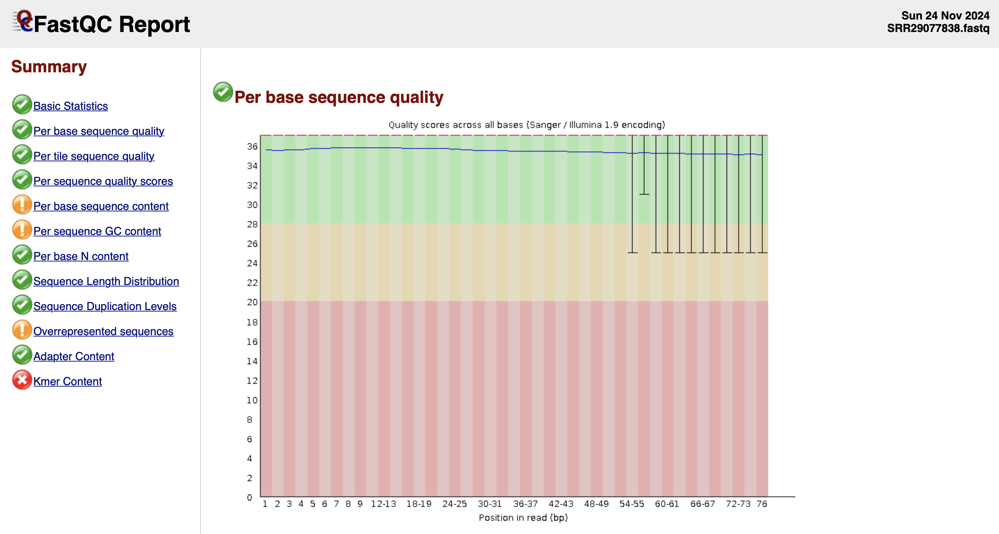

In [10]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/SRR290778378fastqc_1.png'  
display(Image(filename=image_path))

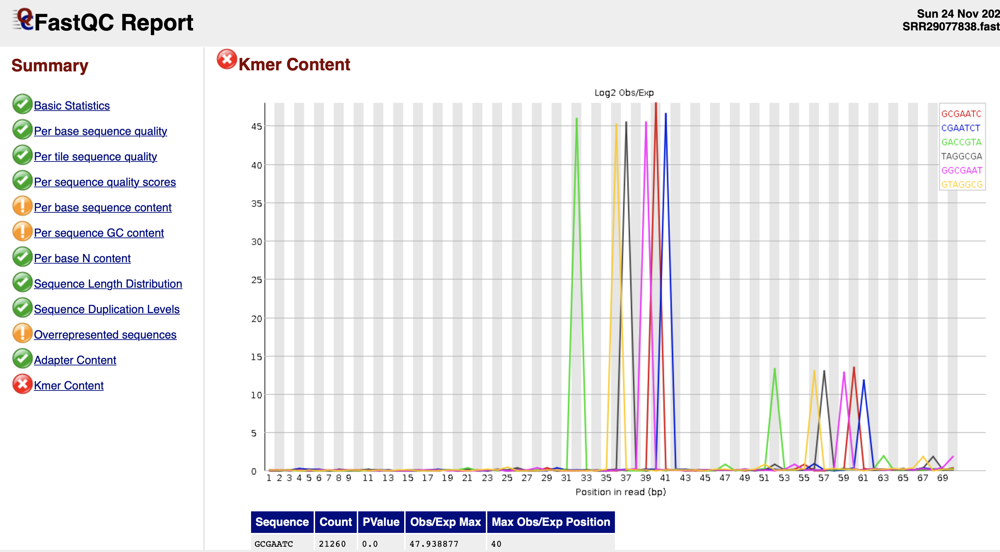

In [8]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/SRR290778378fastqc_2.png'  # Replace with your image file path
display(Image(filename=image_path))

In [5]:
fastp -i SRR29077838.fastq -o SRR29077838_cleaned.fastq --adapter_sequence GATCGGAAGAGCGGTTCAGCAGGAATGCCGAGACCGTAGGCGAATCTCGG

Read1 before filtering:
total reads: 40308072
total bases: 3063413472
Q20 bases: 2954421389(96.4421%)
Q30 bases: 2783547072(90.8642%)

Read1 after filtering:
total reads: 40064377
total bases: 3040529102
Q20 bases: 2938472101(96.6434%)
Q30 bases: 2770145039(91.1073%)

Filtering result:
reads passed filter: 40064377
reads failed due to low quality: 94886
reads failed due to too many N: 311
reads failed due to too short: 148498
reads with adapter trimmed: 291737
bases trimmed due to adapters: 15627360

Duplication rate (may be overestimated since this is SE data): 11.9679%

JSON report: fastp.json
HTML report: fastp.html

fastp -i SRR29077838.fastq -o SRR29077838_cleaned.fastq --adapter_sequence GATCGGAAGAGCGGTTCAGCAGGAATGCCGAGACCGTAGGCGAATCTCGG 
fastp v0.23.2, time used: 97 seconds


We can compare that the number of reads has changed as we eliminated some sequences:

In [19]:
wc -l SRR29077838.fastq | awk '{ print $1/4 }'

40308072


In [6]:
wc -l SRR29077838_cleaned.fastq | awk '{ print $1/4 }'

40064377


Another quality control is done to check if the quality has been improved:

In [7]:
fastqc SRR29077838_cleaned.fastq

Started analysis of SRR29077838_cleaned.fastq
Approx 5% complete for SRR29077838_cleaned.fastq
Approx 10% complete for SRR29077838_cleaned.fastq
Approx 15% complete for SRR29077838_cleaned.fastq
Approx 20% complete for SRR29077838_cleaned.fastq
Approx 25% complete for SRR29077838_cleaned.fastq
Approx 30% complete for SRR29077838_cleaned.fastq
Approx 35% complete for SRR29077838_cleaned.fastq
Approx 40% complete for SRR29077838_cleaned.fastq
Approx 45% complete for SRR29077838_cleaned.fastq
Approx 50% complete for SRR29077838_cleaned.fastq
Approx 55% complete for SRR29077838_cleaned.fastq
Approx 60% complete for SRR29077838_cleaned.fastq
Approx 65% complete for SRR29077838_cleaned.fastq
Approx 70% complete for SRR29077838_cleaned.fastq
Approx 75% complete for SRR29077838_cleaned.fastq
Approx 80% complete for SRR29077838_cleaned.fastq
Approx 85% complete for SRR29077838_cleaned.fastq
Approx 90% complete for SRR29077838_cleaned.fastq
Approx 95% complete for SRR29077838_cleaned.fastq
Analy

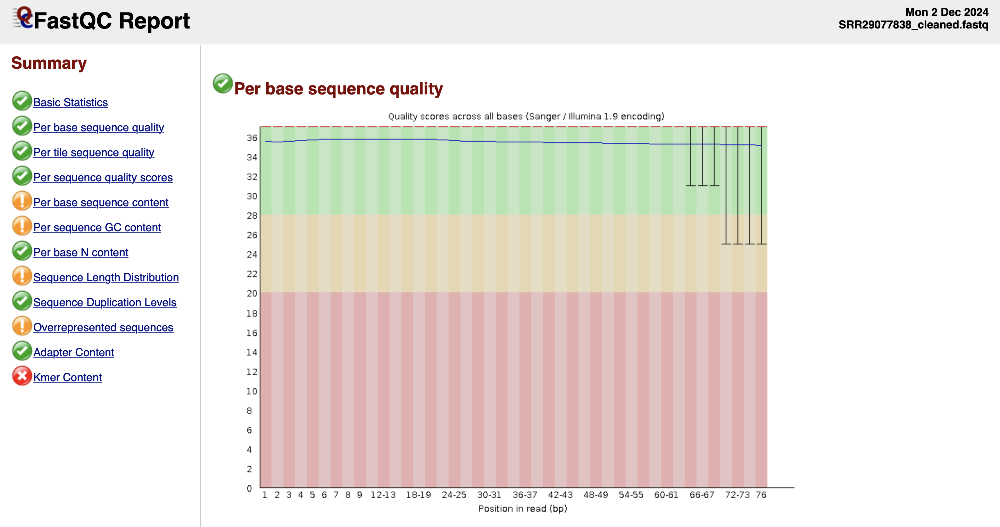

In [11]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/SRR290778378fastqc_cleaned_1.png'  # Replace with your image file path
display(Image(filename=image_path))

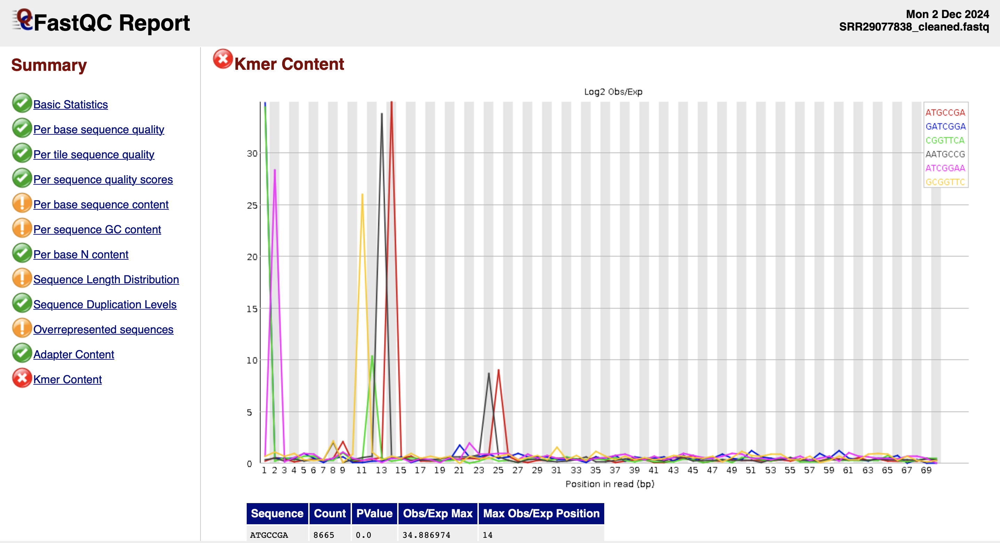

In [13]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/SRR290778378fastqc_cleaned_2.png'  # Replace with your image file path
display(Image(filename=image_path))

The quality control shows better results as expected, the 
But we have a new warning in the sequence lenght distribution.



## Check read quality for sample with antibody:


In [20]:
fastqc SRR29077837.fastq

Started analysis of SRR29077837.fastq
Approx 5% complete for SRR29077837.fastq
Approx 10% complete for SRR29077837.fastq
Approx 15% complete for SRR29077837.fastq
Approx 20% complete for SRR29077837.fastq
Approx 25% complete for SRR29077837.fastq
Approx 30% complete for SRR29077837.fastq
Approx 35% complete for SRR29077837.fastq
Approx 40% complete for SRR29077837.fastq
Approx 45% complete for SRR29077837.fastq
Approx 50% complete for SRR29077837.fastq
Approx 55% complete for SRR29077837.fastq
Approx 60% complete for SRR29077837.fastq
Approx 65% complete for SRR29077837.fastq
Approx 70% complete for SRR29077837.fastq
Approx 75% complete for SRR29077837.fastq
Approx 80% complete for SRR29077837.fastq
Approx 85% complete for SRR29077837.fastq
Approx 90% complete for SRR29077837.fastq
Approx 95% complete for SRR29077837.fastq
Analysis complete for SRR29077837.fastq


The FastQC report is very similar to the other report as it presents almost h¡the same problems:
-There are two warnings in 'Per base sequence content' and in 'Per sequence GC content'

-In the module 'Per sequence GC content' there is a second peak at around 57% that is probably due to the  contamination present in our sample, that will be explained in the next modules.

-Also there are two failed modules:
        Overrepresented sequences: 4 sequences are overrepresented in our case, but they are Illumina Paired End PCR Primer 2, so our sample is contaminated.
    Kmer content: as our sample is even more contaminated than the control sequence, it follows that the Kmer contents finds the contamination due to the Illumina Paired End PCR Primer 2.
    
In order to improve the quality of the sample, the adapter sequences are deleted as done in previous steps.

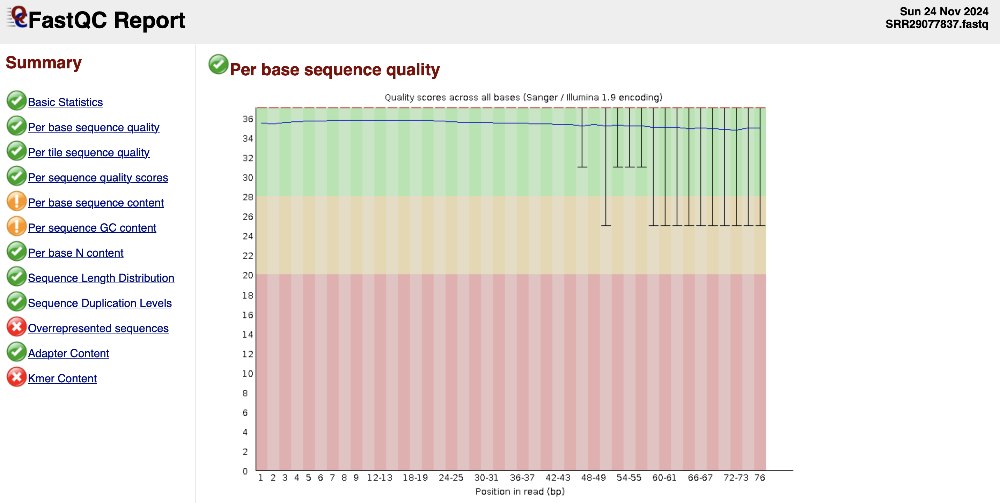

In [15]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/SRR29077837.fastqc_1.png'  # Replace with your image file path
display(Image(filename=image_path))

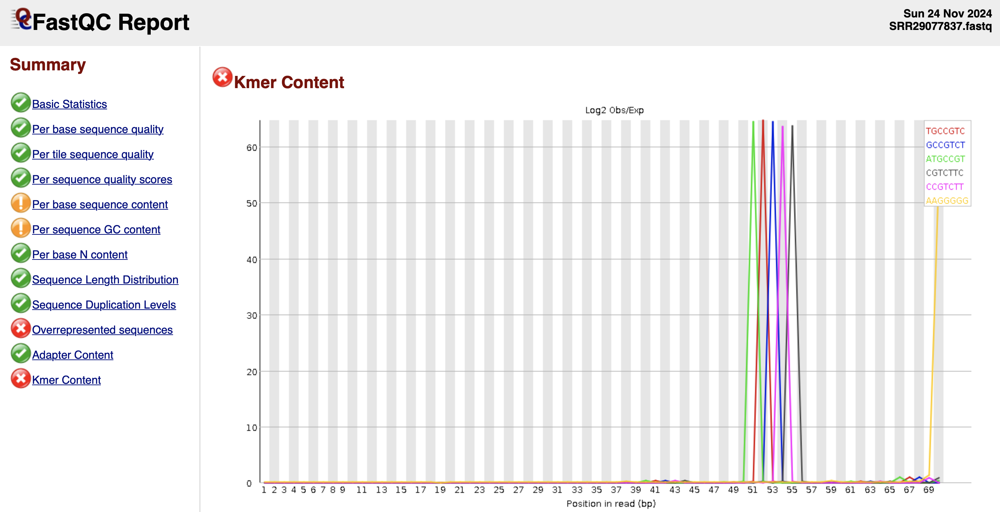

In [16]:
# Display the image
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/SRR29077837.fastqc_2.png'  # Replace with your image file path
display(Image(filename=image_path))

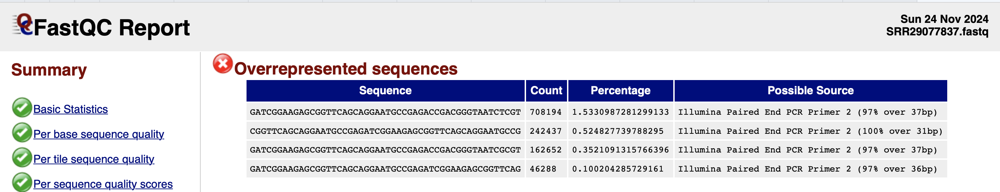

In [17]:
# Display the image
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/SRR29077837.fastqc_3.png'  # Replace with your image file path
display(Image(filename=image_path))

In [8]:
fastp -i SRR29077837.fastq -o SRR29077837_1.fastq --adapter_sequence GATCGGAAGAGCGGTTCAGCAGGAATGCCGAGACCGACGGGTAATCTCGT

Read1 before filtering:
total reads: 46193633
total bases: 3510716108
Q20 bases: 3382012979(96.334%)
Q30 bases: 3182844478(90.6608%)

Read1 after filtering:
total reads: 45136235
total bases: 3410208337
Q20 bases: 3296512326(96.666%)
Q30 bases: 3108772689(91.1608%)

Filtering result:
reads passed filter: 45136235
reads failed due to low quality: 100247
reads failed due to too many N: 416
reads failed due to too short: 956735
reads with adapter trimmed: 1389953
bases trimmed due to adapters: 92747140

Duplication rate (may be overestimated since this is SE data): 19.1064%

JSON report: fastp.json
HTML report: fastp.html

fastp -i SRR29077837.fastq -o SRR29077837_1.fastq --adapter_sequence GATCGGAAGAGCGGTTCAGCAGGAATGCCGAGACCGACGGGTAATCTCGT 
fastp v0.23.2, time used: 123 seconds


In [9]:
fastp -i SRR29077837_1.fastq -o SRR29077837_2.fastq --adapter_sequence CGGTTCAGCAGGAATGCCGAGATCGGAAGAGCGGTTCAGCAGGAATGCCG

Read1 before filtering:
total reads: 45136235
total bases: 3410208337
Q20 bases: 3296512326(96.666%)
Q30 bases: 3108772689(91.1608%)

Read1 after filtering:
total reads: 44813517
total bases: 3402829472
Q20 bases: 3289326910(96.6645%)
Q30 bases: 3101925790(91.1573%)

Filtering result:
reads passed filter: 44813517
reads failed due to low quality: 258
reads failed due to too many N: 0
reads failed due to too short: 322460
reads with adapter trimmed: 342389
bases trimmed due to adapters: 6758116

Duplication rate (may be overestimated since this is SE data): 17.7122%

JSON report: fastp.json
HTML report: fastp.html

fastp -i SRR29077837_1.fastq -o SRR29077837_2.fastq --adapter_sequence CGGTTCAGCAGGAATGCCGAGATCGGAAGAGCGGTTCAGCAGGAATGCCG 
fastp v0.23.2, time used: 138 seconds


In [10]:
fastp -i SRR29077837_2.fastq -o SRR29077837_3.fastq --adapter_sequence GATCGGAAGAGCGGTTCAGCAGGAATGCCGAGACCGACGGGTAATCGCGT

Read1 before filtering:
total reads: 44813517
total bases: 3402829472
Q20 bases: 3289326910(96.6645%)
Q30 bases: 3101925790(91.1573%)

Read1 after filtering:
total reads: 44813024
total bases: 3402800939
Q20 bases: 3289303562(96.6646%)
Q30 bases: 3101905245(91.1574%)

Filtering result:
reads passed filter: 44813024
reads failed due to low quality: 0
reads failed due to too many N: 0
reads failed due to too short: 493
reads with adapter trimmed: 855
bases trimmed due to adapters: 27156

Duplication rate (may be overestimated since this is SE data): 17.1239%

JSON report: fastp.json
HTML report: fastp.html

fastp -i SRR29077837_2.fastq -o SRR29077837_3.fastq --adapter_sequence GATCGGAAGAGCGGTTCAGCAGGAATGCCGAGACCGACGGGTAATCGCGT 
fastp v0.23.2, time used: 127 seconds


In [11]:
fastp -i SRR29077837_3.fastq -o SRR29077837_cleaned.fastq --adapter_sequence GATCGGAAGAGCGGTTCAGCAGGAATGCCGAGATCGGAAGAGCGGTTCAG

Read1 before filtering:
total reads: 44813024
total bases: 3402800939
Q20 bases: 3289303562(96.6646%)
Q30 bases: 3101905245(91.1574%)

Read1 after filtering:
total reads: 44812649
total bases: 3402775703
Q20 bases: 3289282258(96.6647%)
Q30 bases: 3101886150(91.1575%)

Filtering result:
reads passed filter: 44812649
reads failed due to low quality: 0
reads failed due to too many N: 0
reads failed due to too short: 375
reads with adapter trimmed: 377
bases trimmed due to adapters: 24974

Duplication rate (may be overestimated since this is SE data): 17.1235%

JSON report: fastp.json
HTML report: fastp.html

fastp -i SRR29077837_3.fastq -o SRR29077837_cleaned.fastq --adapter_sequence GATCGGAAGAGCGGTTCAGCAGGAATGCCGAGATCGGAAGAGCGGTTCAG 
fastp v0.23.2, time used: 139 seconds


In [21]:
#check the number of readings:
wc -l SRR29077837.fastq | awk '{ print $1/4 }'

46193633


In [12]:
wc -l SRR29077837_cleaned.fastq | awk '{ print $1/4 }'

44812649


In [13]:
fastqc SRR29077837_cleaned.fastq

Started analysis of SRR29077837_cleaned.fastq
Approx 5% complete for SRR29077837_cleaned.fastq
Approx 10% complete for SRR29077837_cleaned.fastq
Approx 15% complete for SRR29077837_cleaned.fastq
Approx 20% complete for SRR29077837_cleaned.fastq
Approx 25% complete for SRR29077837_cleaned.fastq
Approx 30% complete for SRR29077837_cleaned.fastq
Approx 35% complete for SRR29077837_cleaned.fastq
Approx 40% complete for SRR29077837_cleaned.fastq
Approx 45% complete for SRR29077837_cleaned.fastq
Approx 50% complete for SRR29077837_cleaned.fastq
Approx 55% complete for SRR29077837_cleaned.fastq
Approx 60% complete for SRR29077837_cleaned.fastq
Approx 65% complete for SRR29077837_cleaned.fastq
Approx 70% complete for SRR29077837_cleaned.fastq
Approx 75% complete for SRR29077837_cleaned.fastq
Approx 80% complete for SRR29077837_cleaned.fastq
Approx 85% complete for SRR29077837_cleaned.fastq
Approx 90% complete for SRR29077837_cleaned.fastq
Approx 95% complete for SRR29077837_cleaned.fastq
Analy

The fastQC shows also better quality of the sample, as expected with three warnings and one failed test of the K-mer sequences that in this case has been highly reduced as the in the first QC report the first sequence showed the following values:

    Sequence:	Count:	PValue:	    Obs/Exp Max:	        Max Obs/Exp Position:

     TGCCGTC	92435	0.0	        64.6553                  52
     
In comparison with the first sequence for the new QC:
    
    Sequence:	Count:	    PValue:	     Obs/Exp Max:	    Max Obs/Exp Position:
      GATCGGA	347          0.0	     31.671951	                     1
     
We can see a big improvement in the quality of the sample.

The fact that there are more reads in the sample with the antibodies is due to the fact that antibodies increase target specificity and it enhances sensitivity. 

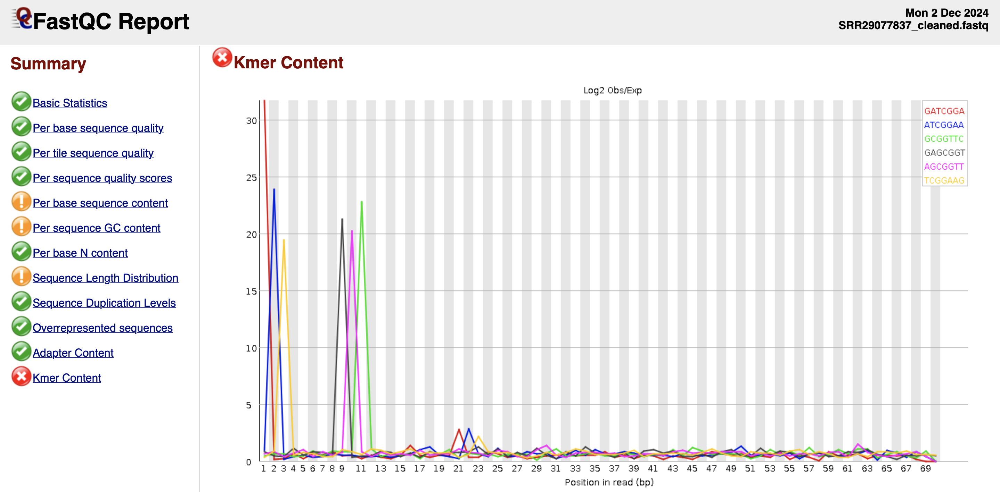

In [18]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/SRR29077837.fastqc_cleaned.png' 
display(Image(filename=image_path))

## Alignment of ChIP-seq reads for the SRR29077837.sam

In order to align the reads to the genome, the ultrafast and memory-efficient tool bowtie2 will be used for aligning sequencing reads to long reference sequences. In this step, the same reference genome that was discussed in class (hg19 human) will be used,  which can be found at /mnt/storage/data/resources/bowtie2.

In [2]:
bowtie2 -x /mnt/storage/data/resources/bowtie2/hg19 SRR29077837_cleaned.fastq -S SRR29077837.sam

44812649 reads; of these:
  44812649 (100.00%) were unpaired; of these:
    1217666 (2.72%) aligned 0 times
    34152828 (76.21%) aligned exactly 1 time
    9442155 (21.07%) aligned >1 times
97.28% overall alignment rate


Check some lines of the SAM file to see if the alginement looks correct.

In [15]:
head -500 SRR29077837.sam | tail -5

SRR29077837.425	16	chr18	34293369	42	76M	*	0	0	GTGGTTAGTGTATATATTGTAATGCCTAGAGCAACCACTACAAAAACCAGAAGAAACAATGTACTTGGAACACTAT	FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	AS:i:0	XN:i:0	XM:i:0	XO:i:0	XG:i:0	NM:i:0	MD:Z:76	YT:Z:UU
SRR29077837.426	0	chr8	101453860	42	76M	*	0	0	TCTCAGGCACTGTCTCGTGGGTTTGGAAGCAGCAATTAATCCTCTAAGGAAAGGTCTGGAAGAGCTTGGTATGGTG	FFFFFFFFFF:FFFFFFFFFFFFFFFF:FFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFFF	AS:i:0	XN:i:0	XM:i:0	XO:i:0	XG:i:0	NM:i:0	MD:Z:76	YT:Z:UU
SRR29077837.427	0	chrM	8716	30	76M	*	0	0	TAAAGGACGAACCTGATCTCTTATACTAGTATCCTTAATCATTTTTATTGCCACAACTAACCTCCTCGGACTCCTG	F:FF::FF,:F:::,F,F:FF,,:FF,F:FF,FF,,F,F:FFFFFFFFF,,::FFF:,FF:FFFFFF,:FF:FFF:	AS:i:0	XS:i:-5	XN:i:0	XM:i:0	XO:i:0	XG:i:0	NM:i:0	MD:Z:76	YT:Z:UU
SRR29077837.428	0	chr15	71972421	42	76M	*	0	0	CAGAGTAGAAAAGACGGATAAATAATTTTGGGAGTTGGAAATTTAGGTAATCAGTCCTCTTTAAAAAGAGGGGAGT	FF:FFFFFFFFFFFF::FFFFFFF:FFFFF,:FFFFF,:FFFFFFFFFFFF:FFFFFFFFFFFFFFFFF:FFFFF:	AS:i:0	XN:i:0	XM:i:0	X

The SAM (Sequence Alignment Map) file is converted to BAM (Binary Alignment/Map) format as the BAM format is compressed, it is optimized for computational speed and this format is needed for peak calling and visualization.

In [16]:
samtools view -S -b SRR29077837.sam > SRR29077837.bam

The SAM file is deleted to save space

In [17]:
rm SRR29077837.sam

Number of reads in the BAM file:

In [18]:
samtools view -c SRR29077837.bam

44812649


To know from these reads which ones are mapped we need to filter the unmapped and secondary alignment reads. Firstly the correct flag settings for samtools view need to be retrieved, this is done in the next command where we ask for the number we need to get the mapped primary reads:

In [19]:
# Get correct flag settings for samtools view (second column).
samtools flags UNMAP,SECONDARY

0x104	260	UNMAP,SECONDARY


Now we got the number that we wanted, 260, which is the sum of:

-the readings that are unmapped: `UNMAP: 0x4 = 4` 

-the secondary alignment `SECONDARY: 0x100 = 256`

To filter for unmapped and secondary alignments the command -c -F 260 can be used, where -c stands for counting.

In [9]:
# Number of mapped reads.
samtools view -c -F 260 SRR29077837.bam

43594983


To be able to use the BAM file in IGV, the .bai index needs to be created, this process combines two steps:

-Sorting: ensures that the reads in the BAM file are ordered by their genomic coordinates.

-Indexing: generates an index file that enables quickly access specific regions of the genome without scanning the entire file.

In [10]:
samtools sort -O bam -o SRR29077837.sorted.bam SRR29077837.bam

[bam_sort_core] merging from 13 files and 1 in-memory blocks...


In [11]:
samtools index SRR29077837.sorted.bam

## Alignment of ChIP-seq reads for the control data ("input")
All the previous steps realized for the alignment of ChIP-seq reads for the sample with antibody are reproduced for the control sample. 

In [ ]:
#These commands were deleted by mistake and some of them rerun, that is the reason why some of them are not run.
bowtie2 -x /mnt/storage/data/resources/bowtie2/hg19 SRR29077838_cleaned.fastq -S SRR29077838.sam

Convert to BAM file

In [ ]:
samtools view -S -b SRR29077838.sam > SRR29077838.bam

Delete the SAM file again

In [ ]:
rm SRR29077838.sam

Count reads

In [3]:
samtools view -c SRR29077838.bam

40064377


To filter for unmapped and secondary alignments

In [5]:
# Number of mapped reads.
samtools view -c -F 260 SRR29077838.bam

39109014


Sort and index 

In [4]:
samtools sort -O bam -o SRR29077838.sorted.bam SRR29077838.bam

[bam_sort_core] merging from 12 files and 1 in-memory blocks...


In [5]:
samtools index SRR29077838.sorted.bam

## Check your BAM file in IGV

In this section the files`SRR29077837.sorted.bam` and `SRR29077837.sorted.bam.bai`are opened in the IGV (Integrative Genomics Viewer) in comparison with the control files `SRR29077838.sorted.bam` and `SRR29077838.sorted.bam.bai` to show the over expression of some sequences that were studied in the paper this project is based on, namely (and most important) VGLL1, and other transcription factors that were shared among all three tumor types: TEAD1, TEAD2, TEAD3, TEAD4, GRHL2, RUNX2, AP1, and GATA6.


### VGLL1 for the files`SRR29077837.sorted.bam` and `SRR29077837.sorted.bam.bai`

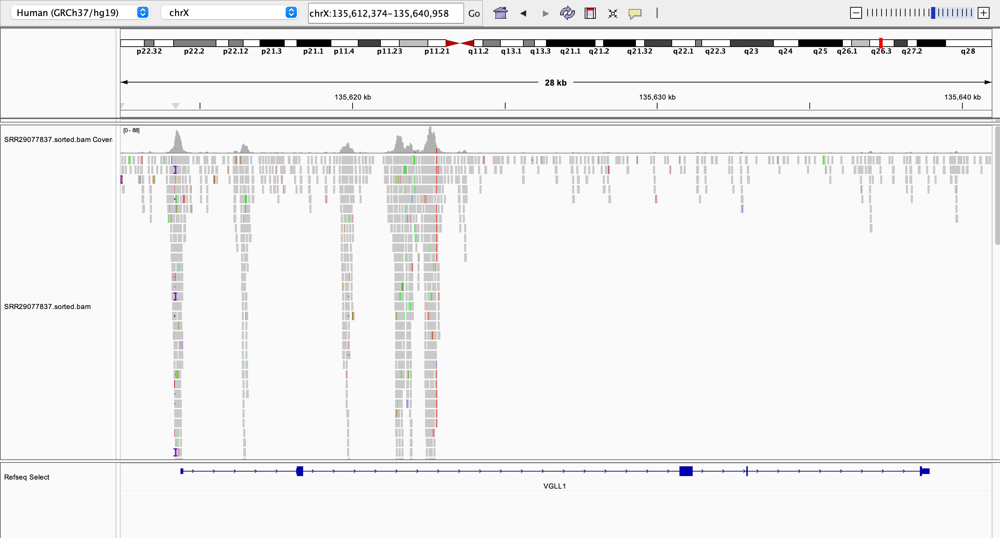

In [20]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/IGV_antibody.png'  
display(Image(filename=image_path))

### VGLL1 for the control files`SRR29077838.sorted.bam` and `SRR29077838.sorted.bam.bai`

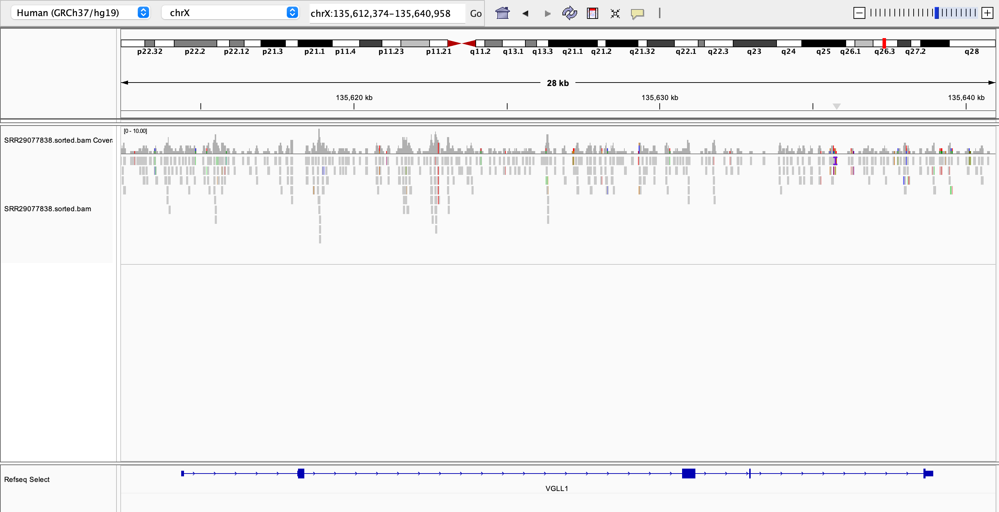

In [21]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/IGV_control.png'  
display(Image(filename=image_path))

### TEAD3 for the files`SRR29077837.sorted.bam` and `SRR29077837.sorted.bam.bai`

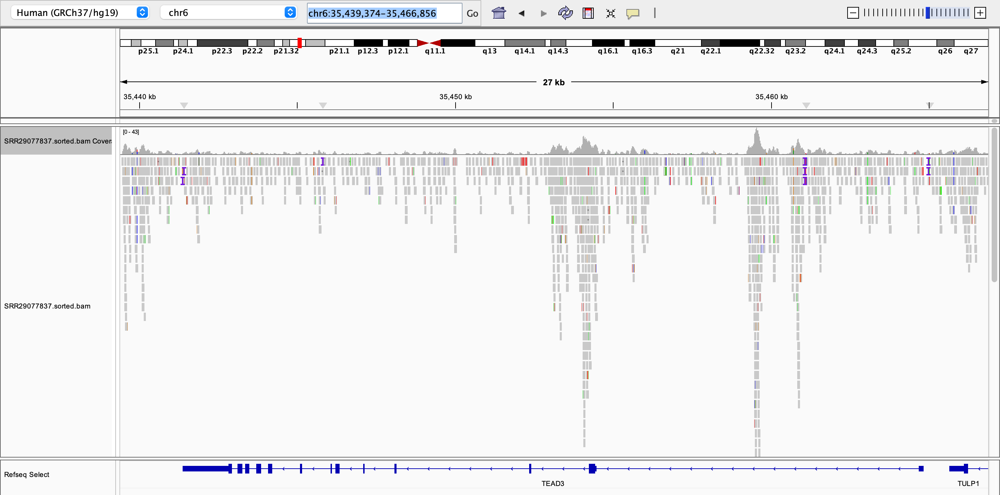

In [3]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/TEAD3_antibody.png'  
display(Image(filename=image_path))

### TEAD3 for the control files`SRR29077838.sorted.bam` and `SRR29077838.sorted.bam.bai`

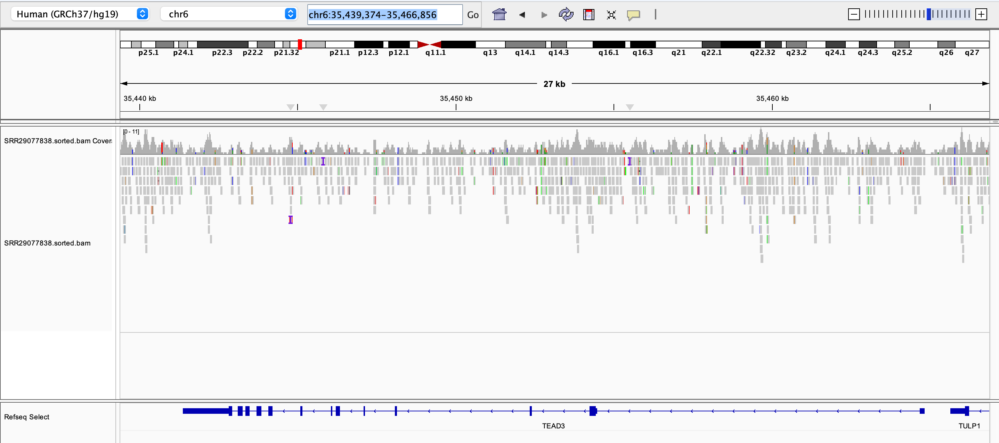

In [4]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/TEAD3_control.png'  
display(Image(filename=image_path))

As we can see in the sample wiht the antibody both VGLL1 and TEAD3 are overexpressed in comparison with the control sample


## Bigwig file creation for visualization in IGV

We are using the command bamCoverage from the package deeptools to create a bigwig file that will contain the average reads which can be used for visualization in IGV or UCSC Genome Browser.

To generate a BigWig file the command bamCoverage from the package deeptools is used. Two different data bin sizes are used as a high bin size averages the coverage over a larger genomic intervals (50 base pairs), potentially reducing resolution but improving signal clarity for large datasets, while low bin sizes (5 base pairs) allow for finer resolution, capturing more detailed coverage information, which is especially useful for visualizing finer patterns like peaks or small-scale variations. However, using a very small bin size may result in noisier data.


The effective size of the whole genome size is 2.864,785,220 bp (this information was obtained in https://deeptools.readthedocs.io/en/develop/content/feature/effectiveGenomeSize.html).

In [7]:
# High bin size
bamCoverage -b SRR29077837.sorted.bam --normalizeUsing RPGC --effectiveGenomeSize 2864785220 -o SRR29077837_hbs.bw -bs 50

normalization: 1x (effective genome size 2864785220)
bamFilesList: ['SRR29077837.sorted.bam']
binLength: 50
numberOfSamples: None
blackListFileName: None
skipZeroOverZero: False
bed_and_bin: False
defaultFragmentLength: read length
numberOfProcessors: 1
verbose: False
region: None
bedFile: None
minMappingQuality: None
ignoreDuplicates: False
chrsToSkip: []
stepSize: 50
center_read: False
samFlag_include: None
samFlag_exclude: None
minFragmentLength: 0
maxFragmentLength: 0
zerosToNans: False
smoothLength: None
save_data: False
out_file_for_raw_data: None
maxPairedFragmentLength: 1000


In [8]:
# Small bin size 
bamCoverage -b SRR29077837.sorted.bam --normalizeUsing RPGC --effectiveGenomeSize 2864785220 -o SRR29077837_sbs.bw -bs 5

normalization: 1x (effective genome size 2864785220)
bamFilesList: ['SRR29077837.sorted.bam']
binLength: 5
numberOfSamples: None
blackListFileName: None
skipZeroOverZero: False
bed_and_bin: False
defaultFragmentLength: read length
numberOfProcessors: 1
verbose: False
region: None
bedFile: None
minMappingQuality: None
ignoreDuplicates: False
chrsToSkip: []
stepSize: 5
center_read: False
samFlag_include: None
samFlag_exclude: None
minFragmentLength: 0
maxFragmentLength: 0
zerosToNans: False
smoothLength: None
save_data: False
out_file_for_raw_data: None
maxPairedFragmentLength: 1000


In the next images, first one shows the VGLL1 and the second one the TEAD3 site, all the possible visualization we obtained until now can be observed:

-Green track: the ChIP-seq results from the paper that has been followed (downloaded from the source http://chip-atlas.org/view?id=SRX24602134 )

-Red track: the control data BigWig file using the small bin size.

-Blue track: the sample with the antibody BigWig file using small bin size.

-Grey track: The sorted sample with the antibody as shown previously applying color alignments by read strand.


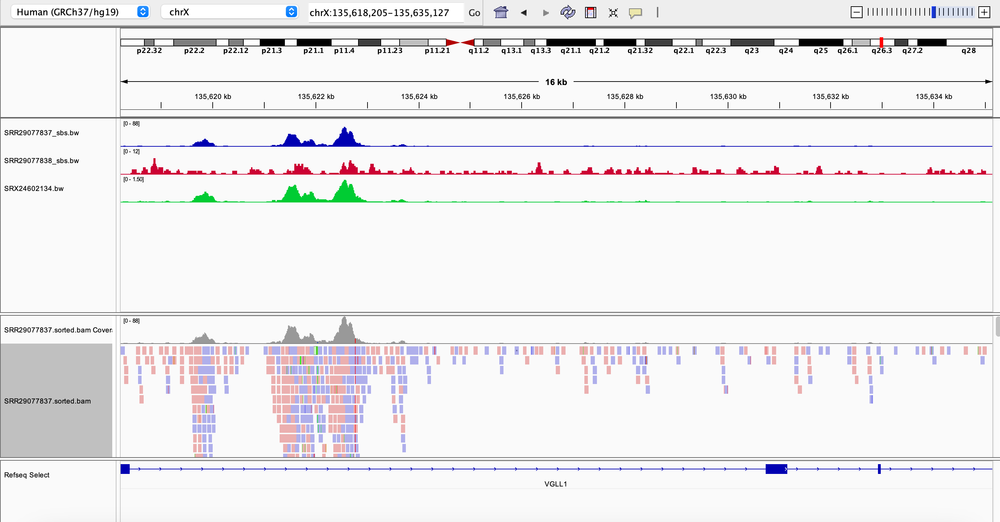

In [9]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/full_IGV_VGLL1.png'  
display(Image(filename=image_path))

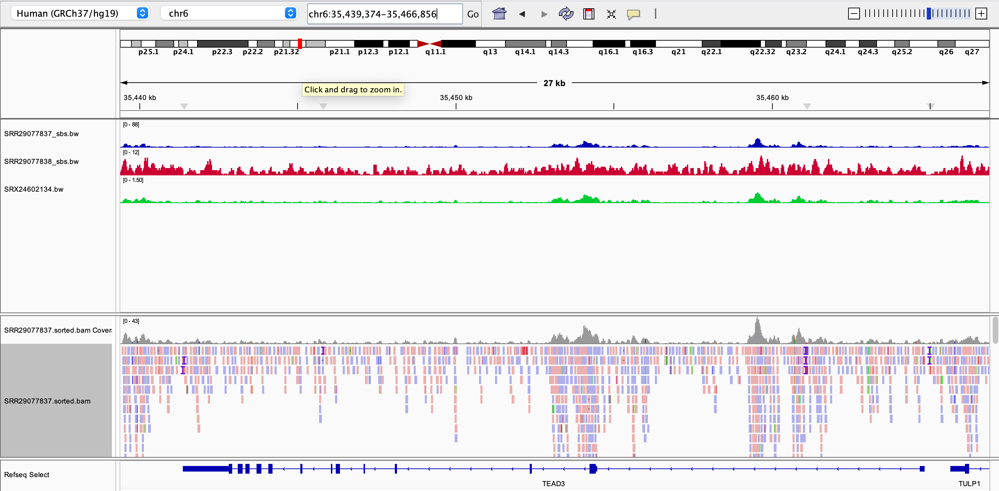

In [10]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/full_IGV_TEAD3.png'  
display(Image(filename=image_path))

## Peak calling 

The next section goal is to determine genomic regions with an enrichment of reads in the form of a "peak" as we will see.

If you color the reads by strand (right click in IGV, color alignments by read strand), you will notice the shift between forward and reverse reads.

In the images before we color alignments by read strand while in the next images we group alignments by read strand (first for the VGLL1 and the second one is for the TEAD3).

The theory behind it is that each bar represents a sequencing read mapped to the genome, and each read is colored by strand (blue = forward strand/sense tags, red = reverse strand/antisense tags). This is coloring is useful to highlight strand-dependent patterns. As we have a high number of reads mapped it can be difficult to ditinguish but in the images a shift between sense and antisense tags can be noticed.


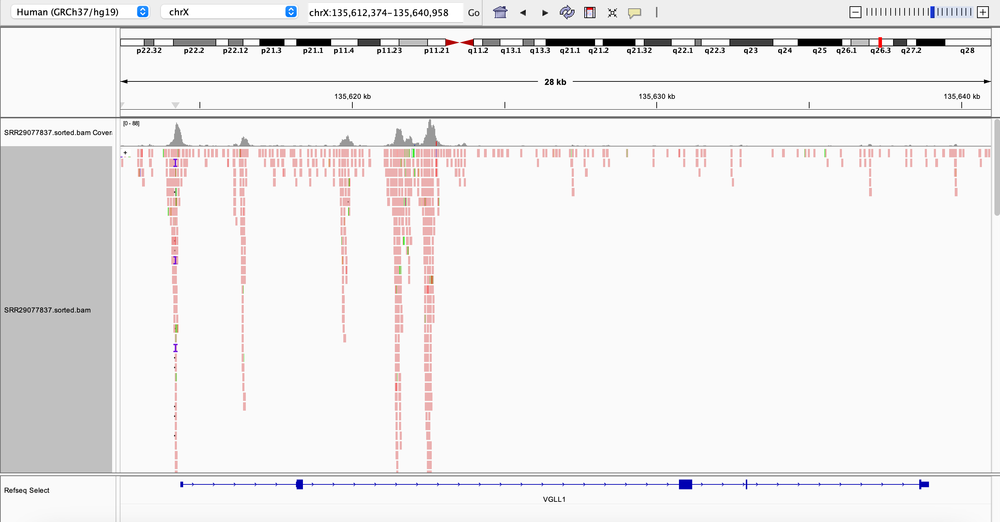

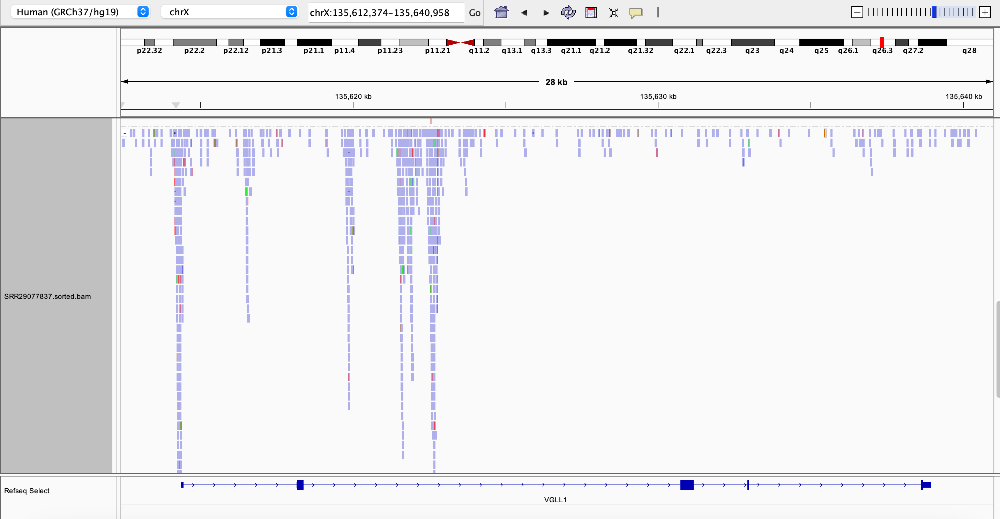

In [17]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/VGLL1_readsbystrand_1.png'  
display(Image(filename=image_path))
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/VGLL1_readsbystrand_2.png'  
display(Image(filename=image_path))

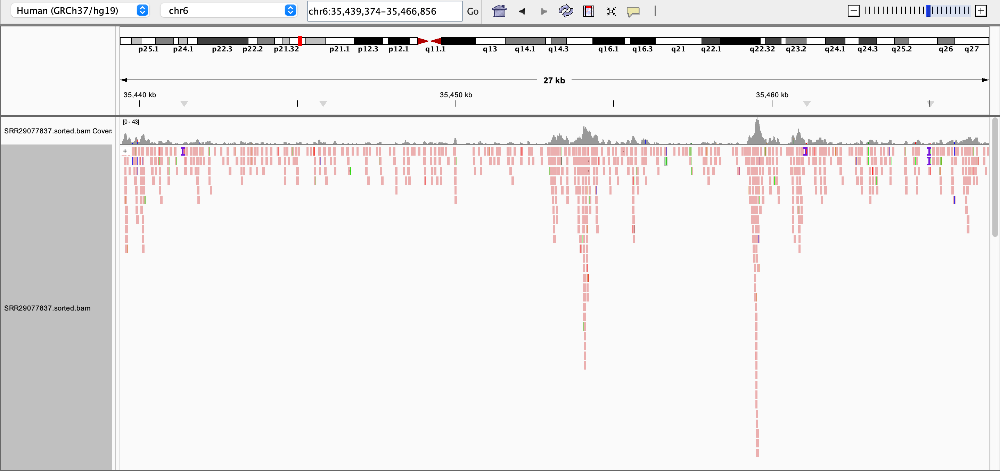

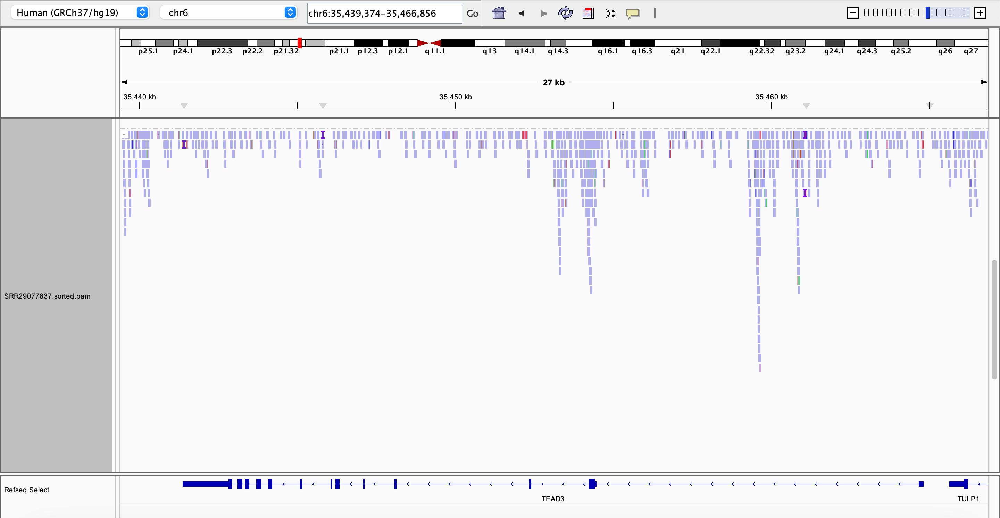

In [16]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/TEAD3_readsbystrand_1.png'  
display(Image(filename=image_path))
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/TEAD3_readsbystrand_2.png'  
display(Image(filename=image_path))

## Peak calling with MACS2

MACS2 is a popular software for analyzing ChIP-seq data. It identifies regions of the genome enriched for reads, which represent areas where proteins (like transcription factors or histones) are bound. 

MACS2 calculates read coverage for the treatment (-t) file and the control (-c) file across the genome. It compares the treatment signal against the control to identify regions with significant enrichment. The control sample is used to model background noise and exclude non-specific signals,this helps identify true peaks where protein-DNA binding is likely occurring.For every candidate peak, MACS2 calculates a statistical score (q-value) to determine if the peak is significantly enriched over the background.


The Effective Genome Size of GRCh37 is 2864785220 bp (This number has been extracted from https://deeptools.readthedocs.io/en/develop/content/feature/effectiveGenomeSize.html).

In [ ]:
macs2 callpeak -t SRR29077837.sorted.bam -c SRR29077838.sorted.bam -n VGLL1 -g 2864785220 -q 0.05

In [10]:
ls -lt | head -5

total 76705800
-rw-r--r--  1 r1028490 domain users     3791165 Dec  7 01:47 VGLL1_summits.bed
-rw-r--r--  1 r1028490 domain users     5840586 Dec  7 01:47 VGLL1_peaks.narrowPeak
-rw-r--r--  1 r1028490 domain users     6586900 Dec  7 01:47 VGLL1_peaks.xls
-rw-r--r--  1 r1028490 domain users       99401 Dec  6 20:28 VGLL1_model.r


Key output files produced by macs2 are :

`VGLL1_peaks.narrowPeak`: this BED6+4 format file lists all the significant peaks with their genomic coordinates and scores. It can be directly loaded to IGV or USCS genome browser. The columns in this file include: chromosome, start and end positions, peak name, -log10(p-value),fold enrichment and the -log10(q-value).

`VGLL1_peaks.xl`: contains a detailed table of all peaks, including more information like summit positions and statistical scores. It can be opened in excel to sort or filer by using excel fucntions. It includes information such as the position or the lenght and the height of detected peak.

`VGLL1_summits.bed`:provides the summit of each peak, which is the position with the highest enrichment within the peak.

`VGLL1_model.r`: R script that can be used to produce a PDF image about the model based on your data. 

In [4]:
cat VGLL1_peaks.narrowPeak | wc -l

76526


The visualization of `VGLL1_peaks.narrowPeak` is displayed below, first showing the VGLL1 sequence and after showing the TEAD3 sequence. The called peaks can be observed.

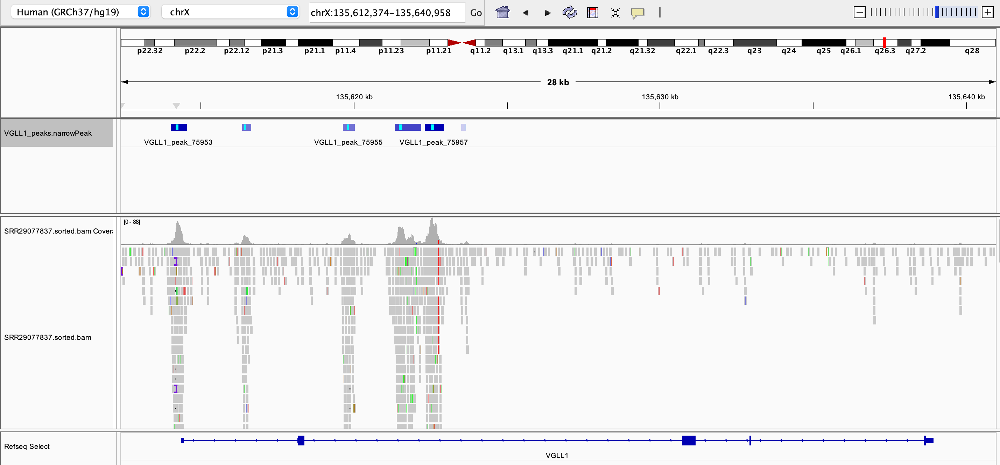

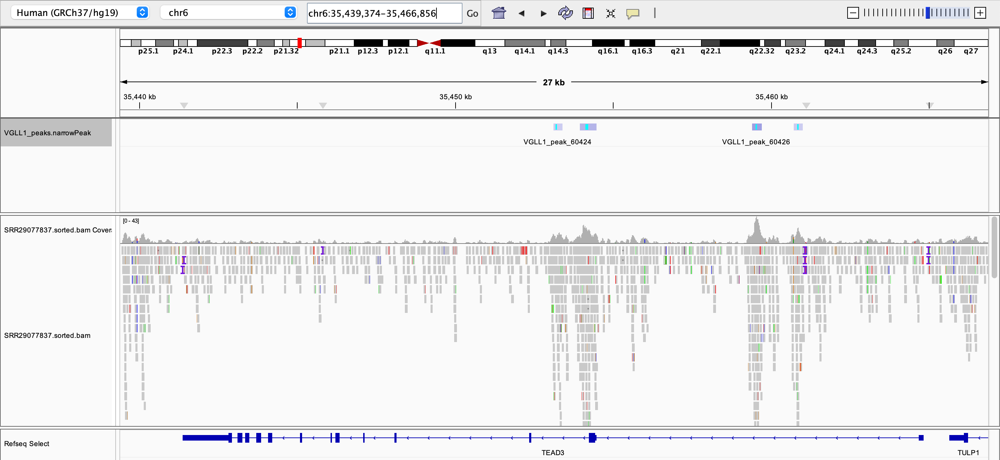

In [3]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/Macs2_VGLL1.png'  
display(Image(filename=image_path))
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/Macs2_TEAD3.png'  
display(Image(filename=image_path))

## Peak calling for test sample

To have a reference-point for the next step, the sbs.bw of our reference is going to be computed:

In [8]:
# Small bin size 
bamCoverage -b SRR29077838.sorted.bam --normalizeUsing RPGC --effectiveGenomeSize 2864785220 -o SRR29077838_sbs.bw -bs 5

normalization: 1x (effective genome size 2864785220)
bamFilesList: ['SRR29077838.sorted.bam']
binLength: 5
numberOfSamples: None
blackListFileName: None
skipZeroOverZero: False
bed_and_bin: False
defaultFragmentLength: read length
numberOfProcessors: 1
verbose: False
region: None
bedFile: None
minMappingQuality: None
ignoreDuplicates: False
chrsToSkip: []
stepSize: 5
center_read: False
samFlag_include: None
samFlag_exclude: None
minFragmentLength: 0
maxFragmentLength: 0
zerosToNans: False
smoothLength: None
save_data: False
out_file_for_raw_data: None
maxPairedFragmentLength: 1000


## Genome-wide ChIP-seq peaks


We will now generate a heatmap of all transcription start sites in the human genome, displaying the coverage of our ChIP-seq data. This will allow us to assess whether there is an enrichment within a 2 kb region surrounding the transcription start sites.

Total number of peaks identified:

In [5]:
cat VGLL1_peaks.narrowPeak | wc -l

76526


Here the first 1000 most statistically significant peaks are showed. In this way, if the total number of peaks obtained is very high, we can prioritize peaks for downstream analysis.

In [5]:
cat VGLL1_peaks.narrowPeak | sort -k9 -g -r | head -1000

chr1	112320582	112321799	VGLL1_peak_3502	4976	.	63.43361	507.11816	497.62668	625
chr14	62221256	62222526	VGLL1_peak_21482	4396	.	43.07663	446.97903	439.65485	876
chr2	37146122	37146837	VGLL1_peak_35739	4333	.	47.69916	440.48782	433.34851	305
chr1	192962604	192963309	VGLL1_peak_5732	4303	.	52.90715	437.40527	430.31689	404
chr8	12934937	12935561	VGLL1_peak_67993	4182	.	55.46085	425.21783	418.26541	312
chr1	19378737	19379493	VGLL1_peak_541	4134	.	41.85773	420.30618	413.40909	376
chr6	146157400	146158364	VGLL1_peak_63099	4121	.	67.21033	419.06906	412.19351	711
chr13	111137729	111138456	VGLL1_peak_20285	4076	.	47.32449	414.44116	407.62546	334
chr9	96974274	96974936	VGLL1_peak_72583	4076	.	34.53758	414.43564	407.62085	345
chr9	99676567	99677337	VGLL1_peak_72716	4064	.	44.44313	413.26862	406.48386	414
chr10	7896710	7897871	VGLL1_peak_8074	4056	.	54.04348	412.43475	405.66998	670
chr5	53737930	53738689	VGLL1_peak_55169	3992	.	44.79601	405.85422	399.20096	359
chr5	116203195	116203850	VGLL1_peak_

We cut the first three columns to make a BED file

In [6]:
cat VGLL1_peaks.narrowPeak | cut -f 1-3 > VGLL1_peaks.bed

Next we will do a two-step process in which:

-The computeMatrix command calculates the average ChIP-seq signal in and around each peak in the BED file, producing a signal intensity matrix.This allows us to analyze the signal pattern relative to the peak center across all regions of interest.

-The plotHeatmap command takes the signal matrix and generates a heatmap. Each row in the heatmap corresponds to one peak (from the BED file), and the signal intensity is visualized as a gradient. High-intensity regions will appear brighter or darker (depending on the color scheme), highlighting enrichment.

In [3]:
computeMatrix reference-point \
    -S SRR29077838_sbs.bw \
    -R VGLL1_peaks.bed \
    --referencePoint center \
    -a 2000 \
    -b 2000 \
    --binSize 5 \
    -out VGLL1.tab.gz

In [9]:
plotHeatmap \
    -m VGLL1.tab.gz \
    -out VGLL1-peaks.png \
    --heatmapHeight 15  \
    --refPointLabel peak.center \
    --regionsLabel peaks \
    --plotTitle 'ChIP-seq signal'

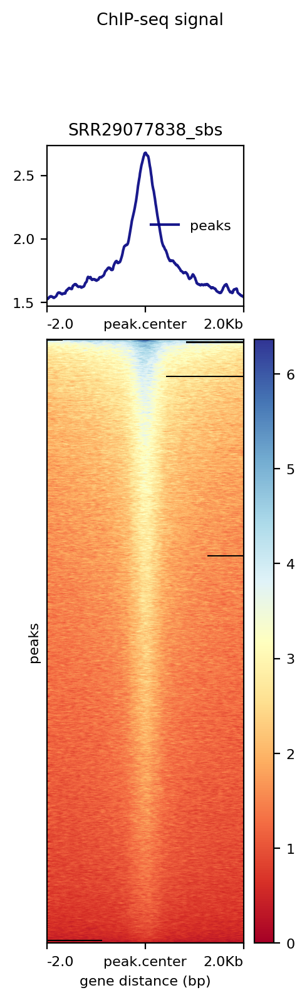

In [4]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/VGLL1-peaks.png'  
display(Image(filename=image_path))

In the image we can observe that:

-There is a clear and sharp enrichment at the center of the peaks, indicative of localized binding of the protein of interest, VGLL1 in our case. 

-The signal is symmetric around the center, suggesting that the binding pattern is uniform.

-Most peaks exhibit similar patterns of enrichment, as evidenced by the consistent signal across rows in the heatmap.

-The peaks represent regions where the protein of interest (targeted by ChIP) binds to the genome. 

-The observed central enrichment suggests that the protein binds specifically and consistently at these genomic sites. 

-The 2 kb flanking regions show lower signal intensity, indicating that binding is confined to the core regions of interest.


## Fragment length prediction and peaks finding 

To estimate the fragment length and the read extension model for our ChIP-seq data the command macs2 predictd is used. The predictd option evaluates the distribution of paired-end or single-end reads to determine the optimal shift size for the peak-calling model. We do it for both samples, with and wihtout antibodies.

In [14]:
macs2 predictd -i SRR29077837.sorted.bam

INFO  @ Wed, 11 Dec 2024 17:01:54: # read alignment files... 
INFO  @ Wed, 11 Dec 2024 17:01:54: # read treatment tags... 
INFO  @ Wed, 11 Dec 2024 17:01:54: Detected format is: BAM 
INFO  @ Wed, 11 Dec 2024 17:01:54: * Input file is gzipped. 
INFO  @ Wed, 11 Dec 2024 17:02:00:  1000000 
INFO  @ Wed, 11 Dec 2024 17:02:06:  2000000 
INFO  @ Wed, 11 Dec 2024 17:02:11:  3000000 
INFO  @ Wed, 11 Dec 2024 17:02:17:  4000000 
INFO  @ Wed, 11 Dec 2024 17:02:22:  5000000 
INFO  @ Wed, 11 Dec 2024 17:02:28:  6000000 
INFO  @ Wed, 11 Dec 2024 17:02:33:  7000000 
INFO  @ Wed, 11 Dec 2024 17:02:38:  8000000 
INFO  @ Wed, 11 Dec 2024 17:02:43:  9000000 
INFO  @ Wed, 11 Dec 2024 17:02:49:  10000000 
INFO  @ Wed, 11 Dec 2024 17:02:54:  11000000 
INFO  @ Wed, 11 Dec 2024 17:02:59:  12000000 
INFO  @ Wed, 11 Dec 2024 17:03:05:  13000000 
INFO  @ Wed, 11 Dec 2024 17:03:10:  14000000 
INFO  @ Wed, 11 Dec 2024 17:03:15:  15000000 
INFO  @ Wed, 11 Dec 2024 17:03:24:  16000000 
INFO  @ Wed, 11 Dec 2024 17:0

In [3]:
macs2 predictd -i SRR29077838.sorted.bam

INFO  @ Thu, 12 Dec 2024 20:29:00: # read alignment files... 
INFO  @ Thu, 12 Dec 2024 20:29:00: # read treatment tags... 
INFO  @ Thu, 12 Dec 2024 20:29:00: Detected format is: BAM 
INFO  @ Thu, 12 Dec 2024 20:29:00: * Input file is gzipped. 
INFO  @ Thu, 12 Dec 2024 20:29:05:  1000000 
INFO  @ Thu, 12 Dec 2024 20:29:10:  2000000 
INFO  @ Thu, 12 Dec 2024 20:29:15:  3000000 
INFO  @ Thu, 12 Dec 2024 20:29:20:  4000000 
INFO  @ Thu, 12 Dec 2024 20:29:25:  5000000 
INFO  @ Thu, 12 Dec 2024 20:29:30:  6000000 
INFO  @ Thu, 12 Dec 2024 20:29:36:  7000000 
INFO  @ Thu, 12 Dec 2024 20:29:41:  8000000 
INFO  @ Thu, 12 Dec 2024 20:29:46:  9000000 
INFO  @ Thu, 12 Dec 2024 20:29:51:  10000000 
INFO  @ Thu, 12 Dec 2024 20:29:56:  11000000 
INFO  @ Thu, 12 Dec 2024 20:30:01:  12000000 
INFO  @ Thu, 12 Dec 2024 20:30:06:  13000000 
INFO  @ Thu, 12 Dec 2024 20:30:11:  14000000 
INFO  @ Thu, 12 Dec 2024 20:30:16:  15000000 
INFO  @ Thu, 12 Dec 2024 20:30:21:  16000000 
INFO  @ Thu, 12 Dec 2024 20:3

Predicted fragment sizes are 191bp and 73bp. Now we can create the needed BedGraph files using macs2 callpeak -B and extsize ~ fragment length.
In the next commands peak files are generated with enrichment regions and their corresponding signal intensities.

In [4]:
macs2 callpeak -B -t SRR29077837.sorted.bam -n VGLL1_differential_1 --nomodel --extsize 200

INFO  @ Thu, 12 Dec 2024 20:37:21: 
# Command line: callpeak -B -t SRR29077837.sorted.bam -n VGLL1_differential_1 --nomodel --extsize 200
# ARGUMENTS LIST:
# name = VGLL1_differential_1
# format = AUTO
# ChIP-seq file = ['SRR29077837.sorted.bam']
# control file = None
# effective genome size = 2.70e+09
# band width = 300
# model fold = [5, 50]
# qvalue cutoff = 5.00e-02
# The maximum gap between significant sites is assigned as the read length/tag size.
# The minimum length of peaks is assigned as the predicted fragment length "d".
# Larger dataset will be scaled towards smaller dataset.
# Range for calculating regional lambda is: 10000 bps
# Broad region calling is off
# Paired-End mode is off
 
INFO  @ Thu, 12 Dec 2024 20:37:21: #1 read tag files... 
INFO  @ Thu, 12 Dec 2024 20:37:21: #1 read treatment tags... 
INFO  @ Thu, 12 Dec 2024 20:37:21: Detected format is: BAM 
INFO  @ Thu, 12 Dec 2024 20:37:21: * Input file is gzipped. 
INFO  @ Thu, 12 Dec 2024 20:37:26:  1000000 
INFO  @ T

In [3]:
macs2 callpeak -B -t SRR29077838.sorted.bam -n VGLL1_differential_2 --nomodel --extsize 200

INFO  @ Sat, 14 Dec 2024 14:35:24: 
# Command line: callpeak -B -t SRR29077838.sorted.bam -n VGLL1_differential_2 --nomodel --extsize 200
# ARGUMENTS LIST:
# name = VGLL1_differential_2
# format = AUTO
# ChIP-seq file = ['SRR29077838.sorted.bam']
# control file = None
# effective genome size = 2.70e+09
# band width = 300
# model fold = [5, 50]
# qvalue cutoff = 5.00e-02
# The maximum gap between significant sites is assigned as the read length/tag size.
# The minimum length of peaks is assigned as the predicted fragment length "d".
# Larger dataset will be scaled towards smaller dataset.
# Range for calculating regional lambda is: 10000 bps
# Broad region calling is off
# Paired-End mode is off
 
INFO  @ Sat, 14 Dec 2024 14:35:24: #1 read tag files... 
INFO  @ Sat, 14 Dec 2024 14:35:24: #1 read treatment tags... 
INFO  @ Sat, 14 Dec 2024 14:35:24: Detected format is: BAM 
INFO  @ Sat, 14 Dec 2024 14:35:24: * Input file is gzipped. 
INFO  @ Sat, 14 Dec 2024 14:35:29:  1000000 
INFO  @ S

Find the number of reads after filtering which will be needed for the bdgdiff command. They are also printed in the runtime message of the command.

In [7]:
egrep "tags after filtering in treatment|tags after filtering in control" VGLL1_differential_1_peaks.xls

# tags after filtering in treatment: 35114048


In [8]:
egrep "tags after filtering in treatment|tags after filtering in control" VGLL1_differential_2_peaks.xls

# tags after filtering in treatment: 33980405


Inspect the bdg files

In [9]:
ls -lt *.bdg

-rw-r--r-- 1 r1028490 domain users 1082899163 Dec 14 17:25 VGLL1_differential_2_control_lambda.bdg
-rw-r--r-- 1 r1028490 domain users 2122960043 Dec 14 17:25 VGLL1_differential_2_treat_pileup.bdg
-rw-r--r-- 1 r1028490 domain users 1096498931 Dec 13 00:09 VGLL1_differential_1_control_lambda.bdg
-rw-r--r-- 1 r1028490 domain users 2120834512 Dec 13 00:09 VGLL1_differential_1_treat_pileup.bdg


Perform the differential analysis

In [4]:
macs2 bdgdiff \
    --t1 VGLL1_differential_1_treat_pileup.bdg \
    --c1 VGLL1_differential_1_control_lambda.bdg \
    --t2 VGLL1_differential_2_treat_pileup.bdg \
    --c2 VGLL1_differential_2_control_lambda.bdg \
    --d1 35114048 \
    --d2 33980405 \
    -g 60 \
    -l 80 \
    --o-prefix diff_antibody_vs_non

INFO  @ Mon, 23 Dec 2024 19:00:57: Read and build treatment 1 bedGraph... 
INFO  @ Mon, 23 Dec 2024 19:03:11: Read and build control 1 bedGraph... 
INFO  @ Mon, 23 Dec 2024 19:04:23: Read and build treatment 2 bedGraph... 
INFO  @ Mon, 23 Dec 2024 19:06:37: Read and build control 2 bedGraph... 
INFO  @ Mon, 23 Dec 2024 19:19:13: Write peaks... 
INFO  @ Mon, 23 Dec 2024 19:19:14: Done 


In [6]:
ls -lt *.bed | head

-rw-r--r-- 1 r1028490 domain users  221712 Dec 23 19:19 diff_antibody_vs_non_c3.0_common.bed
-rw-r--r-- 1 r1028490 domain users   49521 Dec 23 19:19 diff_antibody_vs_non_c3.0_cond2.bed
-rw-r--r-- 1 r1028490 domain users 5936412 Dec 23 19:19 diff_antibody_vs_non_c3.0_cond1.bed
-rw-r--r-- 1 r1028490 domain users  161291 Dec 14 17:25 VGLL1_differential_2_summits.bed
-rw-r--r-- 1 r1028490 domain users 6701415 Dec 13 00:09 VGLL1_differential_1_summits.bed
-rw-r--r-- 1 r1028490 domain users 1830276 Dec 11 16:51 VGLL1_peaks.bed
-rw-r--r-- 1 r1028490 domain users 3791165 Dec  7 01:47 VGLL1_summits.bed


Compare the created BED files with the initial BigWig files between the two conditions (with or without antibody).

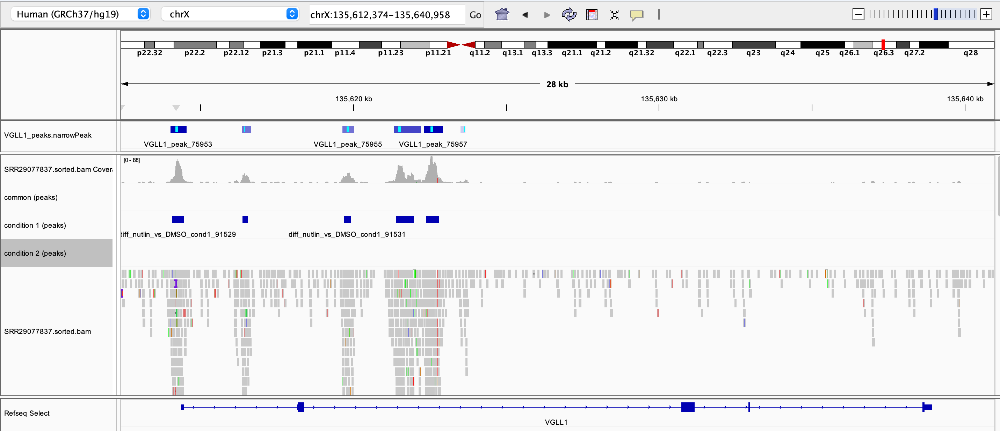

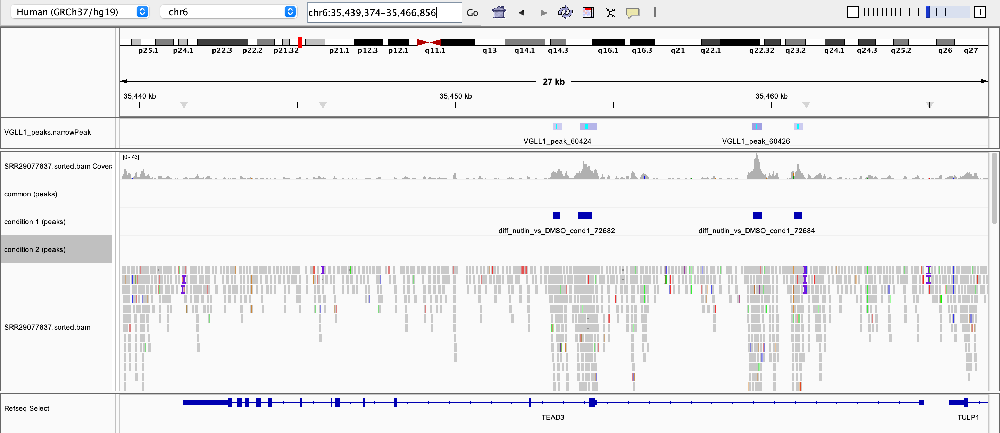

In [2]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/commonpeaks_VGLL1.png'  
display(Image(filename=image_path))
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/commonpeaks_TEAD3.png'  
display(Image(filename=image_path))

Top regions for Condition 1 (= antibody).

In [7]:
cat diff_antibody_vs_non_c3.0_cond1.bed | sort -k 5 -gr | head

chr1	112320930	112321692	diff_nutlin_vs_DMSO_cond1_4158	289.36279
chr14	62221812	62222439	diff_nutlin_vs_DMSO_cond1_25713	255.28479
chr10	92690830	92691282	diff_nutlin_vs_DMSO_cond1_11959	241.32397
chr13	46101975	46102422	diff_nutlin_vs_DMSO_cond1_23077	233.11902
chr4	18367730	18368227	diff_nutlin_vs_DMSO_cond1_61162	219.64256
chr12	8134782	8135380	diff_nutlin_vs_DMSO_cond1_17921	216.48709
chr2	37325510	37325972	diff_nutlin_vs_DMSO_cond1_42955	213.14514
chr5	116203291	116203792	diff_nutlin_vs_DMSO_cond1_68483	205.56296
chr8	12934973	12935526	diff_nutlin_vs_DMSO_cond1_81863	203.31929
chr1	192962679	192963250	diff_nutlin_vs_DMSO_cond1_6812	201.77335
sort: write failed: 'standard output': Broken pipe
sort: write error


Top reagions for Condition 2 (=control)

In [3]:
cat diff_antibody_vs_non_c3.0_cond2.bed | sort -k 5 -gr | head

chr16	30798995	30799094	diff_nutlin_vs_DMSO_cond2_269	37.27900
chr1	36336406	36336488	diff_nutlin_vs_DMSO_cond2_19	36.91616
chr14	67305821	67305941	diff_nutlin_vs_DMSO_cond2_224	31.16275
chr10	30681816	30681896	diff_nutlin_vs_DMSO_cond2_96	30.93135
chr7	143566262	143566390	diff_nutlin_vs_DMSO_cond2_714	30.54324
chr12	111478283	111478372	diff_nutlin_vs_DMSO_cond2_191	30.45905
chr14	106674958	106675079	diff_nutlin_vs_DMSO_cond2_235	29.57691
chr2	164841739	164841865	diff_nutlin_vs_DMSO_cond2_453	29.25401
chr11	117204599	117204721	diff_nutlin_vs_DMSO_cond2_148	29.20454
chr5	87396351	87396443	diff_nutlin_vs_DMSO_cond2_612	29.10360
sort: write failed: 'standard output': Broken pipe
sort: write error


# Motif analysis
In this section the enriched DNA sequence motifs within the differentially accesible regions obtained in the previous section are indetified. These motifs are important as they can provide insights about the transcription factors that regulate gene expression in these regions. The method that will be followed consists on de novo motif discovery using the Regulatory Sequence Analysis Tools (RSAT).

In our case only the top differentially accessible 5000 regions will be used.


First to get the top 5000 differentially accesible regions:

In [9]:
cat diff_antibody_vs_non_c3.0_cond1.bed | sort -k 5,5gr | head -n 5000 > diff_antibody_vs_non_c3.0_cond1_top.bed

sort: write failed: 'standard output': Broken pipe
sort: write error


Next step is to convert the bed file into a fasta file

In [11]:
bedtools getfasta -fi /mnt/storage/data/resources/mm10/mm10.fa -bed diff_antibody_vs_non_c3.0_cond1_top.bed -fo diff_antibody_vs_non_c3.0_cond1_top.fasta

Feature (chr3:179222081-179222591) beyond the length of chr3 size (160039680 bp).  Skipping.
Feature (chr5:179685955-179686881) beyond the length of chr5 size (151834684 bp).  Skipping.
Feature (chr4:186251209-186251679) beyond the length of chr4 size (156508116 bp).  Skipping.
Feature (chr9:126837039-126837455) beyond the length of chr9 size (124595110 bp).  Skipping.
Feature (chr8:144074733-144075144) beyond the length of chr8 size (129401213 bp).  Skipping.
Feature (chr1:246598756-246599335) beyond the length of chr1 size (195471971 bp).  Skipping.
WARNING. chromosome (chr21) was not found in the FASTA file. Skipping.
Feature (chr1:233788032-233788554) beyond the length of chr1 size (195471971 bp).  Skipping.
WARNING. chromosome (chr20) was not found in the FASTA file. Skipping.
WARNING. chromosome (chr22) was not found in the FASTA file. Skipping.
Feature (chr2:213824472-213824927) beyond the length of chr2 size (182113224 bp).  Skipping.
Feature (chr1:210438795-210439442) beyond t

Now we check that the fasta file is correct 

In [12]:
head diff_antibody_vs_non_c3.0_cond1_top.fasta

>chr1:112320930-112321692
GTGTGCCACCACTGGCCAGCTACCACTTGTTTTTAAACATCAGAAGAAGGCTGCACAAATTCTAAACTTGACTCCTATGGGAAAGGCTTTCCAAACTTCCTGTGACTCTGAAACATTTGTCTTTAACAAATGCCCCCATTACCTCAGTCAACAAAATACTTACCCTCGGGCCTTCATCGAGTCTCTCACACATTAATGCAAGACTTCCTCTGCTCCCCAGGCCTTTGCTTATTTTCAAATATCTAGTAGCACTAGCTCTAGGAGAAATTTATTCCAGGAAGCACATCCATCTGCTTTTCAGAGTATAATTTCAGGAACTCTTATGCCAGATATTGTTACCACTCTGAGGAAAAAAAAAATGTACTGTTCACATATATTTGCTGATTTATTGAGATATACCTTTCCTTTGGAGTTCAGTAGATCAAAGGCTCTTAGAAATCCTTCATTAGAAAGACTTATTTACTTCATTTTGATCCTTTGATTTGTGGTCAATTAAAGTGAATGAAAGGGAAAACAATGAGACATAAGTAAAACTTTTAAGAGCTCACAATAGATATGTAGAGCAATCCTAGTGGAGGGTGGCAAATATAACTAAATAGAGAATACACACAGGCAATTACAGACTCTAAGGAAAACAAGAGATGCGAGTGCAGTCTTAGAATCACTCAACAGATAACACTTGTAAATAATCACCTACAAAGACAGAGAATTGTGCTAAACACTAGTAAGAGAGGCTTTTAAATGAGGTCAGTAAAACTGCCT
>chr14:62221812-62222439
TGAAAGGACCCTGATATAGTTGTATCTTGTGAGACGATGCCAGTGCCTGGCAAACACAGAAGTGGATGCTCACAGTCAACTATTGGATGGATCACAGGGCCCCCAATGTAGGAGCTAGAGAAAGTACCCAAGGAGCTGAAGGGGTCTGCAACACTATAGGTGGAACAACAATATGAACTAACCAGT

We do the same for the control data to be able to compare them in the RSAT.

In [13]:
cat diff_antibody_vs_non_c3.0_cond2.bed | sort -k 5,5gr | head -n 5000 > diff_antibody_vs_non_c3.0_cond2_top.bed

In [14]:
bedtools getfasta -fi /mnt/storage/data/resources/mm10/mm10.fa -bed diff_antibody_vs_non_c3.0_cond2_top.bed -fo diff_antibody_vs_non_c3.0_cond2_top.fasta

Feature (chr2:235478258-235478430) beyond the length of chr2 size (182113224 bp).  Skipping.
Feature (chr2:231490525-231490605) beyond the length of chr2 size (182113224 bp).  Skipping.
Feature (chr5:163281668-163281754) beyond the length of chr5 size (151834684 bp).  Skipping.
WARNING. chromosome (chr20) was not found in the FASTA file. Skipping.
Feature (chr1:199281142-199281250) beyond the length of chr1 size (195471971 bp).  Skipping.
WARNING. chromosome (chr20) was not found in the FASTA file. Skipping.
Feature (chr8:130913068-130913181) beyond the length of chr8 size (129401213 bp).  Skipping.
Feature (chr5:169267552-169267711) beyond the length of chr5 size (151834684 bp).  Skipping.
Feature (chr2:223091151-223091285) beyond the length of chr2 size (182113224 bp).  Skipping.
Feature (chr1:230187367-230187473) beyond the length of chr1 size (195471971 bp).  Skipping.
Feature (chr3:188228009-188228160) beyond the length of chr3 size (160039680 bp).  Skipping.
Feature (chr6:1519552

In [15]:
head diff_antibody_vs_non_c3.0_cond2_top.fasta

>chr16:30798995-30799094
TCTCCATCTCAAAATATTACTTAAAAATGAAAAAGAAATACAAGGGCTGGAGAGATGGCTCAGCCGTTAAGAATACTTATTGTTCTTGCAGAGGACCTG
>chr1:36336406-36336488
CTATCAAGGCCCCAGCGCTAGGCGCGCCTCATCCAGATTTCATACCTTCTCAAATTCTCTGAATGCCTTCTGAATTTCAGAA
>chr14:67305821-67305941
GCATACTAACGACCTAGAGTGCAGGTATAACTCAACTTACAAGTGTGTAGGTGTCTATTTAACCCTGTCATATTATTTAATCAGGATAATTTGCATCTGACTTTCTGCAGAGAGAATGGG
>chr10:30681816-30681896
ACACACTTAAAATAAAATAAAAGAAAAACACTGTTTATAGATGGCTGTACACTATAGGGTGTGATGGTGCATTTCTGTAC
>chr7:143566262-143566390
AAGCTACCTTTAAGTTCAAAGGCAAAACAACTTTCACCTATGAGTTCTGTCTTGTTTTTGTGTGTGTGTGTGTGTTTTCAAAAAAAAGAGGGAGTGCTGGAGAGATGGCTCAACACTTGGTGGCTTTG


### Results:
The RSAT was obtained (https://rsat.france-bioinformatique.fr/teaching/tmp/www-data/2024/12/26/peak-motifs.2024-12-26.224743_2024-12-26.224743_hVoqRg/peak-motifs_synthesis.html)

4107 peaks were analyzed, with a total of 2011kb of DNA sequence. 
Some statistics were obtained also related to the length of the sequences: minimum length is 85bp, mean lenght is 489.6bp and the maximum lenght is 1000bp 

10 enriched motifs were identified using k-mer frequencies, some of these motifs may represent known transcription factor binding sites or new sequences worthy of further investigation.

Some of the most important motifs:

-Motif 1 appears in 701 peaks (17.07%) with an average of 1.35 sites per peak.

-Motif 6 that is more enriched, appearing in 970 peaks (23.62%) with an average of 2.16 sites per peak.

More enrichment suggests stronger sequence conservation or functional importance, while peaks with higher number of sites might indicate a stronger or cooperative binding activity for some motifs.

Also some warning were obtained:

-"not a single pattern found" indicate no motif matches were identified in specific output files for some k-mer sizes (e.g. 6nt and 7nt). This might occur due to stringent criteria or variability in sequence properties.



The paper that is being followed compares the transcription factors obtained through other methods such as HOMER motif analysis of the three types of cells that are being studies, making more difficlut the comparision with our results. Nevertheless it can be observed that our motif 7 shares similarities with the transcription factor RUNX2 that , and the motif 1 shares similarities with the transcription factor GRHL2.

RUNX2:belongs to the RUNX family of transcription factors and encodes a nuclear protein featuring a Runt DNA-binding domain. The protein plays a crucial role in osteoblast differentiation and skeletal development, serving as a scaffold for nucleic acids and regulatory factors that govern skeletal gene expression.

GRHL2: which plays an important role during embryogenesis establishing distinct zones of primary neurulation. 

The function of these transcription factors was obtained from the source genecards.org

The RSAT with both the data samples with antibody and the control datasample was obtained for possible further analysis: https://rsat.france-bioinformatique.fr/teaching/tmp/www-data/2024/12/26/peak-motifs.2024-12-26.224925_2024-12-26.224925_EdoDog/peak-motifs_synthesis.html

### Results of Motif discovery 

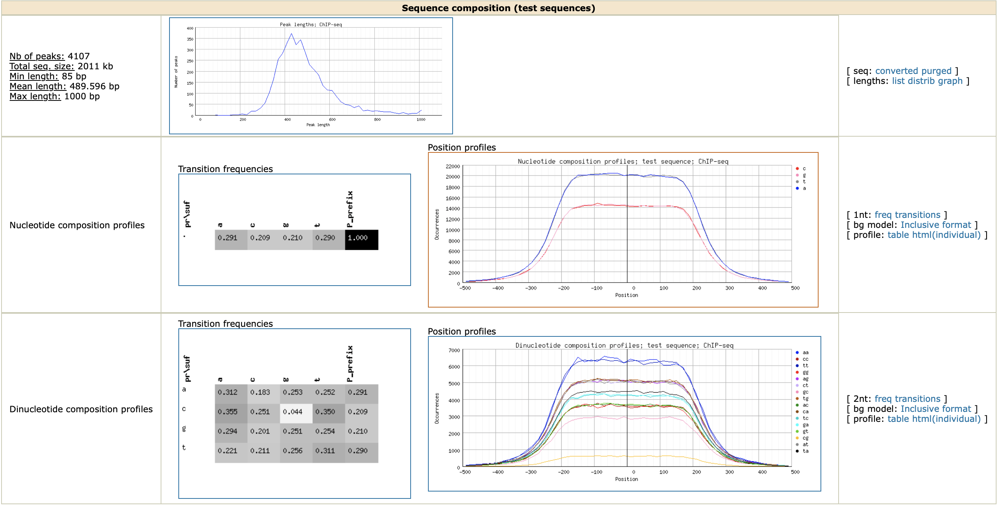

In [8]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/Sequence_composition.png'  
display(Image(filename=image_path))

### Motif 1

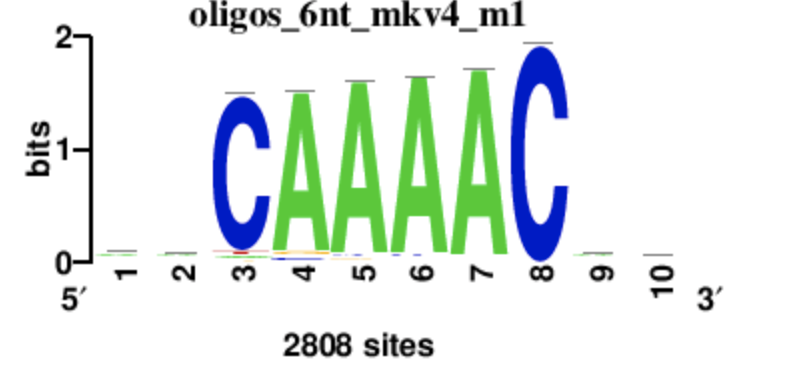

In [9]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/CAAAAC.png'  
display(Image(filename=image_path))

### Motif 6

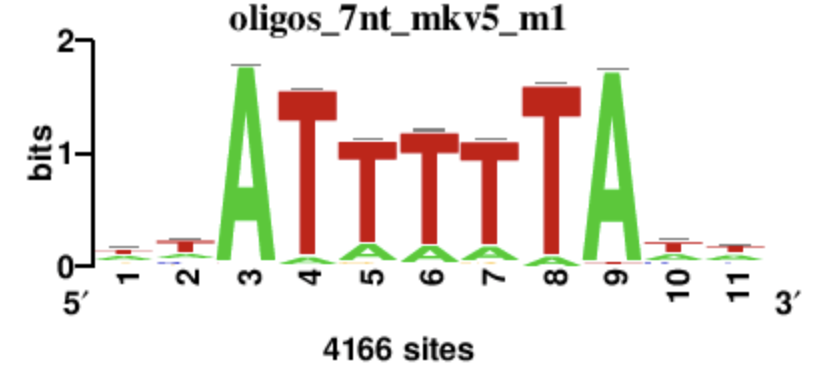

In [7]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/Motif_6.png'  
display(Image(filename=image_path))

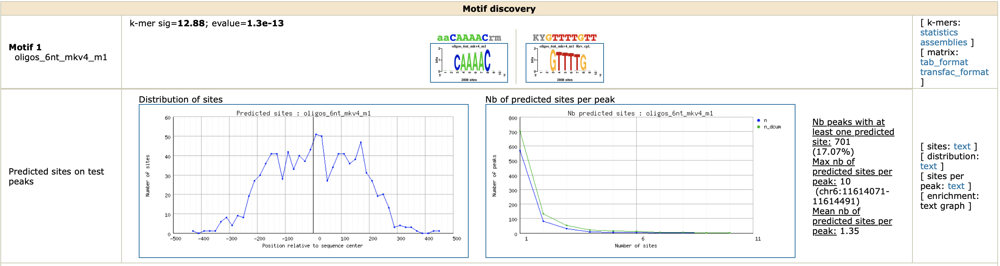

In [11]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/Motif discovery.png'  
display(Image(filename=image_path))

Figure 2F displayed in the paper that has been followed, displaying the different transcription factors that were obtained by their methods.

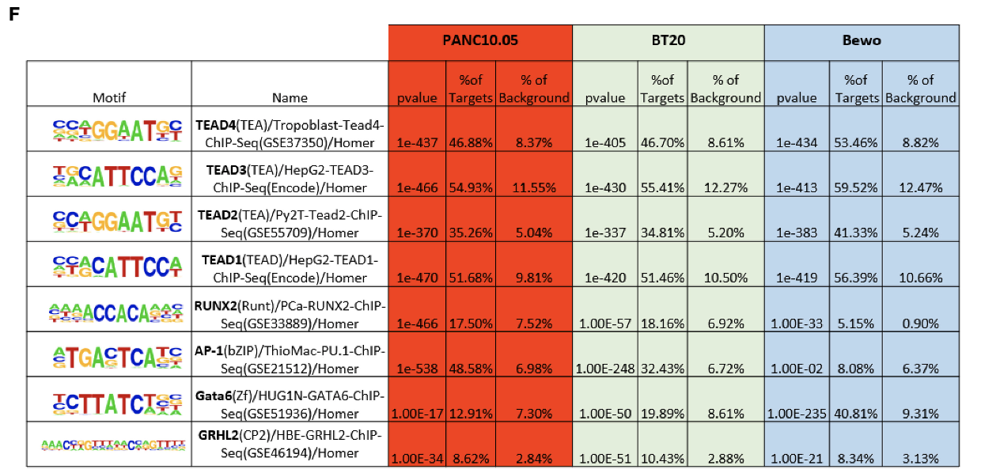

In [12]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/Figure2F.png'  
display(Image(filename=image_path))

The file with all the motifs  can be found in the same folder as the project: "peak-motifs_all_motifs_seqcoord.tab.pdf"

# Link peaks to genes using GREAT

First to be able to run GREAT (Genomic Regions Enrichment of Annotations Tool: http://great.stanford.edu/public/html/index.php) it is needed to take from our bed file ´diff_antibody_vs_non_c3.0_cond2_top.bed´ only the three first columns: chromosome, start and end

In [4]:
awk '{print $1, $2, $3}' diff_antibody_vs_non_c3.0_cond1_top.bed > diff_antibody_vs_non_clean_1.bed

In our case the same parameters as the ones used in class were applied:

Basal+extension (constitutive 5.0 kb upstream and 1.0 kb downstream, up to 50.0 kb max extension), including curated regulatory domains.

The results(http://great.stanford.edu/public/cgi-bin/greatWeb.php) showed that
2,294 of all 5,000 genomic regions (45.9%) are not associated with any genes.
The file ´20241231-public-4.0.4-09FJC6-hg19-all-gene.txt´ can be found also in the same folder as the project.

The number of genes found by GREAT is:

In [9]:
cat 20241231-public-4.0.4-09FJC6-hg19-all-gene.txt | cut -f 1 | grep -v '#' | wc -l

2458


Now we create a list of all genes listofgenes.txt and we are going to search for some of them that were very important in our project, mainly VGLL1 and and TEAD1.

In [11]:
cat 20241231-public-4.0.4-09FJC6-hg19-all-gene.txt | cut -f 1 | grep -v '#' > list_of_genes.txt

In [13]:
cat 20241231-public-4.0.4-09FJC6-hg19-all-gene.txt | cut -f 1 | grep -v '#' | grep -x VGLL1

VGLL1


In [18]:
cat 20241231-public-4.0.4-09FJC6-hg19-all-gene.txt | cut -f 1 | grep -v '#' | grep -x TEAD1

TEAD1


VGLL1 functions as a co-activator in the Hippo signaling pathway, which is critical for regulating cell proliferation and apoptosis, and it partners with TEAD transcription factors, like TEAD1, to drive the expression of genes promoting cell growth and survival.

In placental cells, VGLL1 is involved in the proliferation of trophoblasts, which are essential for placental structure and function. Dysregulation of VGLL1 can lead to abnormal placental development, which is linked to pregnancy-related disorders such as preeclampsia.
In several cancers VGLL1 is overexpressed as its role in activating proliferation-associated genes contributes to unchecked cell growth, a hallmark of cancer.In placental cells, the same mechanisms that promote normal trophoblast proliferation can be co-opted in pathological conditions, leading to tumorigenesis.

The VGLL1-TEAD complex activates genes involved in proliferation (e.g., CCN family genes like CYR61 and CTGF) and survival (e.g., anti-apoptotic pathways). This activation is beneficial in normal placental development but can drive tumorigenesis when dysregulated.

Furthermore VGLL1 and TEAD1 upregulate anti-apoptotic genes, providing a survival advantage to tumor cells, and promote angiogenesis, a hallmark of both placental development and cancer progression, by regulating VEGF and other pro-angiogenic factors.

Sources:
https://pmc.ncbi.nlm.nih.gov/articles/PMC11190739
https://pubmed.ncbi.nlm.nih.gov/37004960/
https://www.nature.com/articles/s41467-024-44780-8?utm_source=chatgpt.com

# Functional analysis

For the functional analysis we will use:

- GO term enrichment of GREAT that ocuses on genomic regions (e.g., promoters, enhancers) and determines the associated gene functions based on spatial proximity and other factors as well.

- gProfiler for the functional enrichment analysis which is used for gene set analysis and works directly with a list of genes to identify enriched GO terms and other functional categories, such as pathways or disease associations.


The gProfiler of our list of genes (list_of_genes.txt) is displayed below:

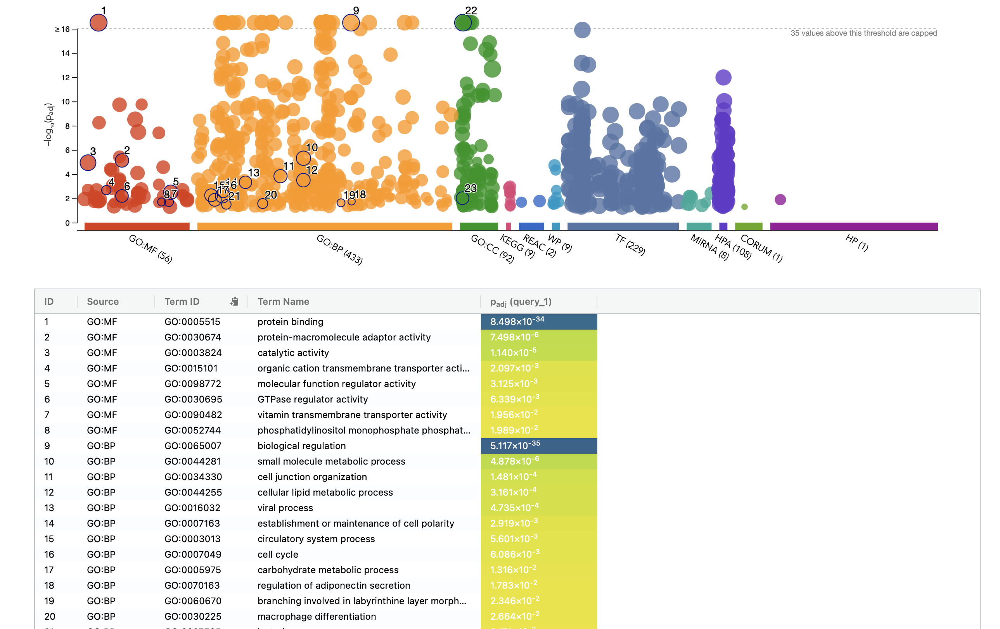

In [2]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/gprofiler.png'  
display(Image(filename=image_path))

The analysis reveals a multifaceted functional landscape with significant emphasis on protein interactions, regulation, metabolic processes, and signaling. The prevalence of terms related to regulation, metabolic activity, and cellular organization suggests the dataset is rich in genes/proteins critical for maintaining cellular homeostasis and function. Pathway and TF enrichment further imply a complex network of interactions and regulatory mechanisms.






In the GO biological function more data were obtained:

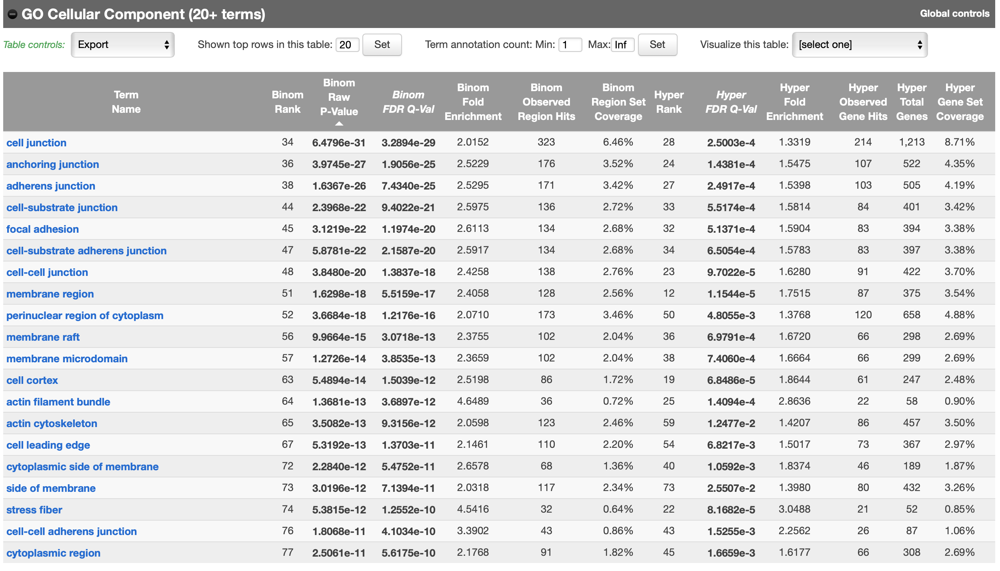

In [3]:
image_path = '/mnt/storage/r1028490/jupyternotebooks/Project2_files/images/GO_cellular.png'  
display(Image(filename=image_path))

- GO Biological Process: Processes related to cell adhesion, stress responses, and proteolysis regulation are highly enriched, suggesting the genes are important in structural and signaling contexts.

- GO Cellular Component: Enrichment in cytoskeletal and cell-membrane-related components suggests the genomic regions are involved in structural dynamics and signaling pathways.

- GO Molecular Function:Enrichment of specific lipid and adaptor activities (e.g., clathrin adaptor) suggests vesicular trafficking relevance.

- Mouse Phenotype the most significant data are:  Abnormal Prenatal Growth and Cardiovascular Development: Strongly enriched, suggesting critical roles during embryogenesis, Abnormal Blood Vessel Morphology and Increased Apoptosis: Indicate involvement in vascular formation and cell death regulation.

The GO analysis reveals that the genomic regions tested are significantly enriched in genes involved in:developmental and structural processes (such as circulatory system development, cell adhesion, and cytoskeletal organization), cellular responses and dynamics (including endocytosis, stress responses, and GTPase-mediated signaling)and embryogenesis and vascular formation (with essential roles in early development and organogenesis).


From these images we can observe that both the gProfiler and the GO analyses confirm the involvement of VGLL1 and TEAD proteins in critical biological processes, including cellular regulation, metabolic pathways, and developmental mechanisms like placental development.Their roles in cancer biology are substantiated by the identification of enriched terms related to cell cycle and viral processes, as well as specific pathways (e.g., Hippo signaling).

The enriched terms related to cellular components like "cytoplasm" and biological processes like "cell junction organization" support the roles of these genes in cellular dynamics and tissue-specific development.
The integration of pathway databases (e.g., KEGG, Reactome) adds depth, linking these genes to specific signaling pathways and molecular mechanisms.

gProfiler revealed broader regulatory insights, such as TF and miRNA associations, which were not covered by the classical GO annotations. These findings are critical for understanding the transcriptional networks and epigenetic regulation involving VGLL1.

The combined use of g:Profiler and GO annotations provided a balanced approach—leveraging the breadth of g:Profiler and the depth of classical GO annotations.




# Conclusion
This project has underscored the pivotal role of VGLL1 as a transcription factor in regulating genes essential for placental biology and tissue organization. The ChIP-seq data, combined with functional annotation tools like g:Profiler and GO analysis, have illuminated VGLL1’s contribution to critical cellular processes, including cell cycle regulation, metabolic homeostasis, and tissue morphogenesis.
Additionally, VGLL1's potential roles in cancer and disease suggest its dual relevance in development and pathology. These insights set the stage for future research into VGLL1’s molecular mechanisms, its interplay with other transcription factors, and its therapeutic potential in diseases such as cancer and placental disorders. This project marks a significant step toward understanding the transcriptional landscape of VGLL1 and its impact on cellular function and development.